# Physics 305 Programming Assignment 1

- Rene L. Principe Jr.
- 2015-04622

## Importing Libraries

In [190]:
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from scipy.stats import norm, describe
from scipy.optimize import curve_fit

# Simulating fractional Brownian motion (fBm)

## `Lambda Function`

In [218]:
# set process parameters
q = 11
N = 2**q + 1 #number of datapoints
M = 2*N - 2
delta = 0.002
print("q: %d, N: %d, M: %d" % (q, N, M))

q: 11, N: 2049, M: 4096


### `fbc(n, G)`

$(n+1)^G + \frac{(n-1)^G - 2nG}{2}$

In [219]:
# define functions
def fbc(n,G):
    return ((n+1)**G + np.abs(n-1)**G - 2*n**G)/2.

def lambda_func(H,N):
    M = 2*N - 2
    C = np.zeros(M)
    G = 2*H
    for i in np.arange(N):
        C[i] = fbc(i,G) # fill in first N out of M values of C (i=0 to N-1)
    C[N:] = C[1:N-1][::-1]
    return np.real(np.fft.fft(C))**0.5

### Visualizing `lambda_func(H,N)`

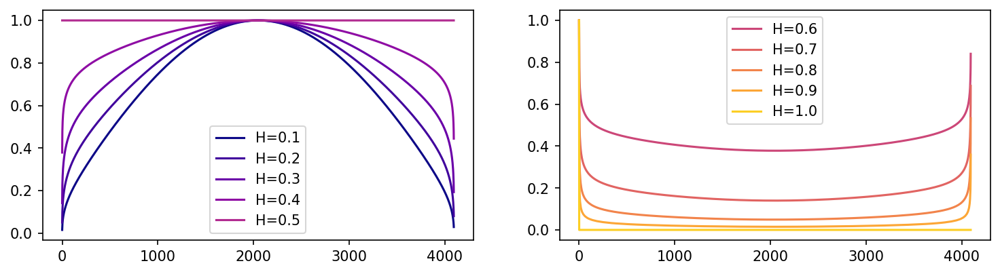

In [220]:
plt.figure(dpi = 150, figsize = (12,3))

for i in range(5):
    plt.subplot(121)
    H = i*0.1 + 0.1
    lambda_function = lambda_func(H, 2049)
    plt.plot(lambda_function/lambda_function.max(), ls = '-', label = "H=%.1f" % H,
            color = plt.cm.plasma(i/10))
    
    plt.legend()

    plt.subplot(122)
    H = i*0.1 + 0.6
    lambda_function = lambda_func(H, 2049)
    plt.plot(lambda_function/lambda_function.max(), ls = '-', label = "H=%.1f" % H,
            color = plt.cm.plasma((i+5)/10))
    plt.legend()
    
plt.show()

## `Noise Function`

In [221]:
noise = np.random.normal(size=(M))

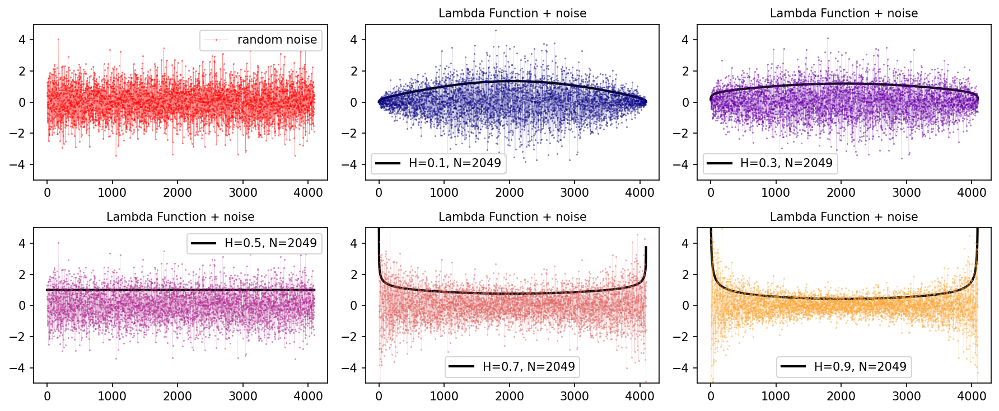

In [222]:
plt.figure(dpi = 150, figsize = (12,5))
plt.subplot(231)
plt.plot(noise, 'r.-', label = "random noise", lw = 0.2, alpha = 0.5, ms = 1)
plt.legend()
plt.ylim(-5,5)

for i in range(5):
    plt.subplot(2,3, i + 2)
    H = i*0.2 + 0.1
    lambda_function = lambda_func(H, 2049)*noise
    plt.plot(lambda_func(H, 2049), 'k-', lw = 2, label = "H=%.1f, N=%d" % (H,N))
    plt.plot(lambda_function, '.-', 
             lw = 0.1, alpha = 0.5, ms = 1, 
             color = plt.cm.plasma(i/5))
    plt.ylim(-5,5)
    plt.title("Lambda Function + noise", fontsize = 10)
    plt.legend()

plt.tight_layout()
plt.show()

An ordinary Brownian Motion would have a purely random noise, however, fractional brownian motion exhibits memory. In this case, we simulate "having a memory" by forcing a noise into the lamda function. As shown above, different Hurst parameter $H$ values correspond to how the fractional noise is eventually shaped. 

The $H$ shapes the Lambda function accordingly in which lowering $H$ magnifies fluctuations through time while larger $H$ deminishes. This will latter on manifest as the diffusive property parameter of the fBm.

In order to simulate fBm, we take the cumulative sum of these fluctuations as shown in the figures below.

###  fBm simulation by taking `cumsum()`

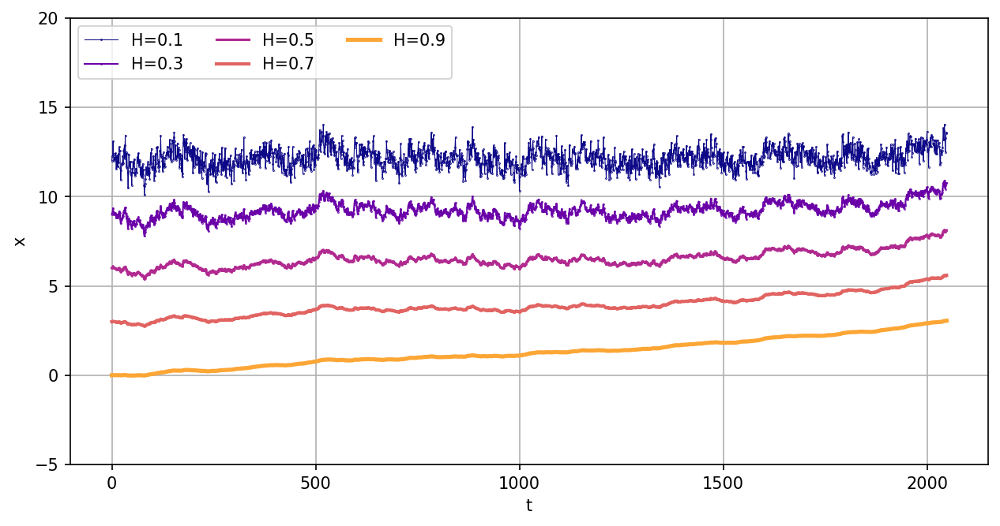

In [196]:
# initialize
fGnsamples = np.zeros((5,N))

# generate fractional Gaussian noise samples
for i in np.arange(5):
    H = 0.2*(i+1) - 0.1
    lambda_res = lambda_func(H,N)
    a = np.fft.ifft(noise)*lambda_res
    b = np.real(np.fft.fft(a))
    fGnsamples[i,0] = 15-3*(i+1)            # apply offset in starting value for visualization
    fGnsamples[i,1:N] = delta**H*b[0:N-1]

# take cumulative sums to get the fractional Brownian motion samples
fBmsamples = np.transpose(np.cumsum(fGnsamples,axis=1)) # cumulative sum over each row

# get values of H
Hval = (np.arange(5) + 1)*0.2 - 0.1

# plot fractional Brownian motion samples
plt.figure(dpi = 150
           , figsize = (10,5))
plt.grid()
for i in np.arange(len(Hval)):
    plt.plot(fBmsamples[:,i], label="H=%.1f" % Hval[i], 
             marker = '.', ls = '-', lw = 0.5*(i+1), ms = 0.7,
             color = plt.cm.plasma(i/5))
    plt.ylim(-5, 20)
    plt.legend(loc="upper left", ncol=3)
    plt.xlabel("t")
    plt.ylabel("x")

As metioned, lowering $H$ magnifies fluctuations through time while larger $H$ deminishes it in the Lmabda function. Upon taking the cumulative sum, we can see that fluctuations are indeed evident on small $H$ while the noise is reduced on big $H$. These different regimes depend on the value of $H$:
- 0 < H < 1/2: subdiffusion
- 1/2 < H < 1: superdiffusion
- H = 1/2: normal diffusion (Brownian motion)

## Generating five fBm samples

In [223]:
def fBm_generator(noise):
    # initialize
    fGnsamples = np.zeros((5,N))

    # generate fractional Gaussian noise samples
    for i in np.arange(5):
        H = 0.2*(i+1) - 0.1
        lambda_res = lambda_func(H,N)
        a = np.fft.ifft(noise)*lambda_res
        b = np.real(np.fft.fft(a))
        fGnsamples[i,0] = 15-3*(i+1)            # apply offset in starting value for visualization
        fGnsamples[i,1:N] = delta**H*b[0:N-1]

    # take cumulative sums to get the fractional Brownian motion samples
    fBmsamples = np.transpose(np.cumsum(fGnsamples,axis=1)) # cumulative sum over each row
    return fBmsamples

In [224]:
np.random.seed(seed=17)
n_samp = 5
# Initialize array to hold the noise samples
noise_samp = np.zeros((M, n_samp))
for i in range(n_samp):
    noise = np.random.normal(size=(M))
    noise_samp[:,i] = noise

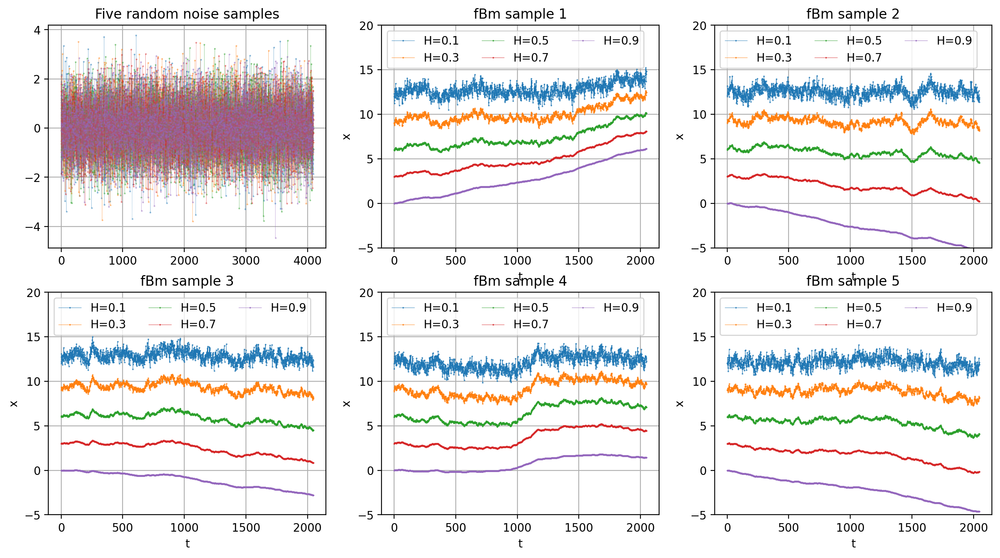

In [225]:
plt.figure(dpi = 200, figsize = (15,8))

plt.subplot(2,3,1)
plt.title("Five random noise samples")
plt.plot(noise_samp, '.-', lw = 0.2, alpha = 0.5, ms = 1)

# Initialize list to hold the fBm samples
fBm_simulations = []

for i, noise in enumerate(noise_samp.T):
    fBmsamples = fBm_generator(noise)
    fBm_simulations.append(fBmsamples)
    plt.grid()
    plt.subplot(2,3,i+2)
    for j in np.arange(len(Hval)):
        plt.title("fBm sample " + str(i+1))
        plt.plot(fBmsamples[:,j], label="H=%.1f" % Hval[j], 
                 marker = '.', ls = '-', lw = 0.3, ms = 0.7)
        plt.ylim(-5, 20)
        plt.xlabel("t")
        plt.ylabel("x")
        plt.legend(loc="upper left", ncol=3)
plt.show()

Here, five sample datasets of fBm samples are generated. The same workflow is implemented on five iterations of random noise, however, a seed in the random noise generator was imposed to generate consistent results.

## Calculating PDFs

###  Pre-defined functions

In [226]:
def get_sample_dx(x, delta):
    x_trunc = x[:-1*delta]
    x_shift = x[delta:]
    dx = x_shift - x_trunc
    return dx

def get_pdf(x, delta, bin_edges, norm=True):
    dx = get_sample_dx(x, delta)
    pdf, junk = np.histogram(dx, bins = bin_edges, density=norm)
    return pdf

def gaussian(x, sigma2, N):
    fac = N/(2.*np.pi*sigma2)**0.5
    return fac*np.exp(-1.*(x)**2/2./sigma2)

# define function that performs fit
def fit_pdf(bin_centers, y, yerr=np.array([]), initial=[1., 1.], maxfev=5000):
    if(len(yerr)==0): # no uncertainties given
        popt, pcov = curve_fit(gaussian, bin_centers, y, initial, maxfev=maxfev)
    else:
        popt, pcov = curve_fit(gaussian, bin_centers, y, initial, sigma=yerr, maxfev=maxfev)
    sigma2, N = popt[0], popt[1]
    err_sigma2, err_N = pcov[0,0]**0.5, pcov[1,1]**0.5
    return sigma2, err_sigma2, N, err_N

### Selecting Test Data

Sample 1, H = 0.1, $\tau$ = 30

In [227]:
sample = 0
H_n = 0
H_test = Hval[H_n]
test_data = fBm_simulations[sample][:, H_n]
tau_test = 30

### Obtaining displacements 

In [228]:
test_dx = get_sample_dx(test_data, tau_test)

### Probability Distribution Functions

In [229]:
xlimit = 5.
n_bins = 50
bin_edges = np.linspace(xlimit*-1., xlimit, n_bins+1)
pdf = get_pdf(test_dx, tau_test, bin_edges, norm=False)

### Gaussian Fit

In [230]:
bin_centers = 0.5*(bin_edges[:-1] + bin_edges[1:])
sigma2, err_sigma2, N, err_N = fit_pdf(bin_centers, pdf)
xx = np.linspace(xlimit*-1., xlimit)
yy = gaussian(xx, sigma2, N)

### Plotting the fBm PDF and Gaussian fit

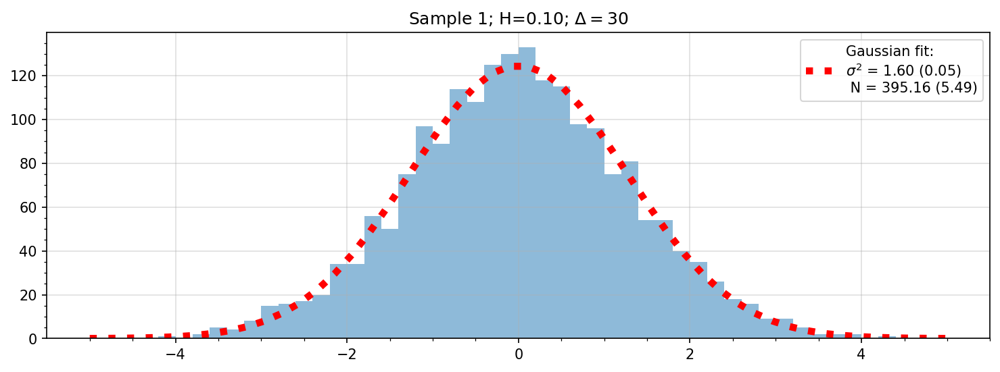

In [231]:
plt.figure(dpi = 150, figsize = (12,4))
plt.grid(alpha = 0.4)
plt.stairs(pdf, bin_edges, fill=True, alpha = 0.5)
plt.plot(xx,yy, 'r:', lw = 5, label = "Gaussian fit: \n" \
        + r"$\sigma^2$ = %.2f (%.2f)" % (sigma2, err_sigma2) \
         + "\n N = %.2f (%.2f)" % (N, err_N))
plt.minorticks_on()
plt.title(r"Sample %d; H=%.2f; $\Delta=%d$" % (sample+1, H_test, tau_test))
plt.legend()
plt.show()

As observed, there is a normal distribution in the displacements in the subdiffusive fBm sample. A gaussian fit is overlayed in red broken line given the standard deviation of the histogram.

### Automate Plotting

In [268]:
def plot_PDF_fBm(sample, H_n, tau_test, xlimit, n_bins, c):
    H_test = Hval[H_n]
    test_data = fBm_simulations[sample][:, H_n]
    
    test_dx = get_sample_dx(test_data, tau_test)
    
    bin_edges = np.linspace(xlimit*-1., xlimit, n_bins+1)
    pdf = get_pdf(test_dx, tau_test, bin_edges, norm=False)
    
    bin_centers = 0.5*(bin_edges[:-1] + bin_edges[1:])
    sigma2, err_sigma2, N, err_N = fit_pdf(bin_centers, pdf)
    xx = np.linspace(xlimit*-1., xlimit)
    yy = gaussian(xx, sigma2, N)
    
    plt.grid(alpha = 0.4)
    plt.stairs(pdf, bin_edges, fill=True, alpha = 0.5, color = c)
    plt.plot(xx,yy, 'r-', lw = 2, label = "Gaussian fit: \n" \
            + r"$\sigma^2$ = %.2f (%.2f)" % (sigma2, err_sigma2) \
             + "\n N = %.2f (%.2f)" % (N, err_N))
    plt.minorticks_on()
    plt.title(r"Sample %d; H=%.2f; $\Delta=%d$" % (sample+1, H_test, tau_test))
    plt.minorticks_on()

    plt.legend(loc = 0)
#     plt.ylim(0,1)
    

## fBm PDFs for different Hurst Exponents

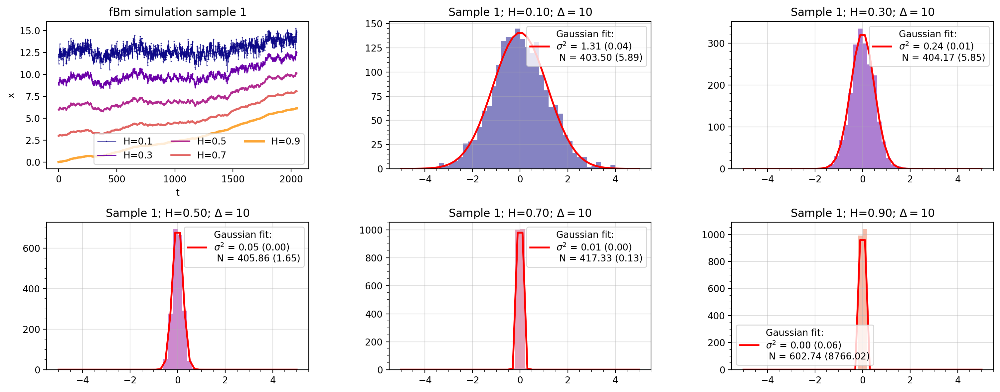

In [269]:
# generate plot for 1 sample
i_samp = 0 # select sample to plot (by index)
plt.figure(dpi = 200, figsize = (15,6))

plt.subplot(2,3,1)
for i in np.arange(len(Hval)):
    plt.plot(fBm_simulations[i_samp][:, i], label="H=%.1f" % Hval[i], 
             marker = '.', ls = '-', lw = 0.5*(i+1), ms = 0.7,
             color = plt.cm.plasma(i/5))
plt.xlabel("t")
plt.ylabel("x")
plt.title("fBm simulation sample " + str(i_samp+1))
plt.legend(ncol=3)

for i in np.arange(5):
    plt.subplot(2,3,i+2)
    plot_PDF_fBm(sample = i_samp, H_n = i, tau_test = 10, xlimit = 5, n_bins = 50, c = plt.cm.plasma(i/6))
    
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.5, wspace=0.5)
plt.tight_layout()

Getting the PDFs for varying Hurst exponents $H$ show that indeed, a great variability in the displacements is evident in the subdiffussive regime, while superdiffusive fBm samples tend to have a narrower distribution, meaning, the displacements are incremental.

## fBm PDFs for different $\tau$

### Setting log-spaced $\tau$ values

In [287]:
n_delta_init = 5 # later, can increase this
logdelta_min = 0
logdelta_max = 2.5
delta_vals = np.unique(np.floor(np.logspace(logdelta_min, logdelta_max, n_delta_init))).astype(int)
delta_vals

array([  1,   4,  17,  74, 316])

### fBm Sample 1, H = 0.1, increasing $\tau$ values

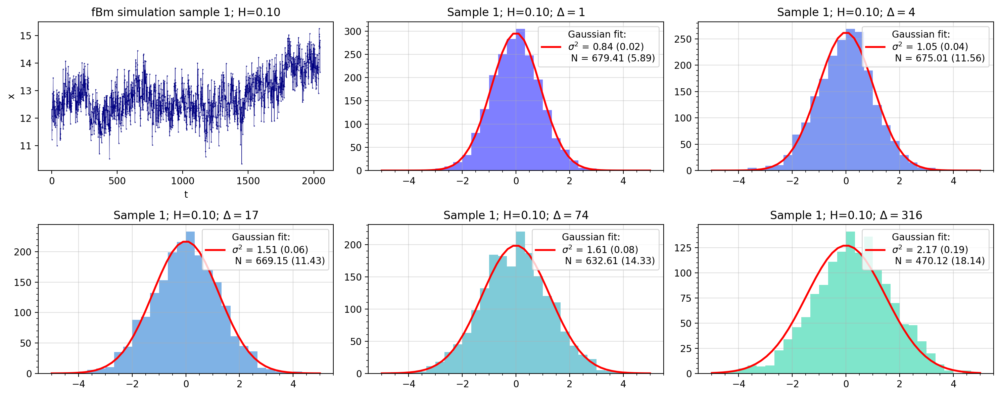

In [271]:
# generate plot for 1 sample
i_samp = 0 # select sample to plot (by index)
H_n = 0

plt.figure(dpi = 200, figsize = (15,6))

plt.subplot(2,3,1)
plt.plot(fBm_simulations[i_samp][:, H_n], 
         marker = '.', ls = '-', lw = 0.3, ms = 0.7,
         color = plt.cm.jet(H_n/5))
plt.xlabel("t")
plt.ylabel("x")
plt.title("fBm simulation sample %d; H=%.2f" % (i_samp+1, Hval[H_n]))
# plt.legend(ncol=3)

for i in np.arange(5):
    plt.subplot(2,3,i+2)
    tau = delta_vals[i]
    plot_PDF_fBm(sample = i_samp, H_n = H_n, tau_test = tau, xlimit = 5, n_bins = 30, c = plt.cm.winter(i/5))
#     plt.ylim(0, 0.5)
    
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.5, wspace=0.5)
plt.tight_layout()

Here we investigate if observations still hold true for varying lag times. As shown above for $H = 0.1$, increasing the lag times generate roughly the same normally distributed PDFs for a subdiffusive fBm sample. Meaning, displacements vary greatly regardeless of the observation window.

### Sample 1, H = 0.9, increasing $\tau$ values

In [285]:
n_delta_init = 5 # later, can increase this
logdelta_min = 1
logdelta_max = 2.7
delta_vals = np.unique(np.floor(np.logspace(logdelta_min, logdelta_max, n_delta_init))).astype(int)
delta_vals

array([ 10,  26,  70, 188, 501])

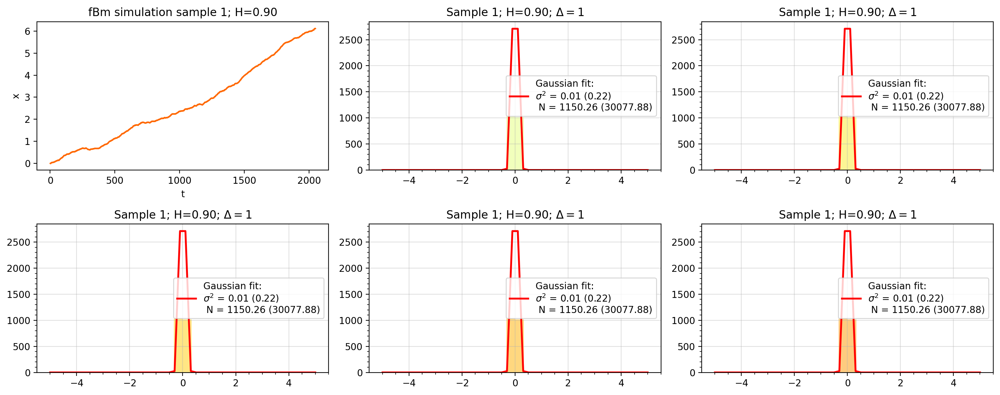

In [419]:
# generate plot for 1 sample
i_samp = 0 # select sample to plot (by index)
H_n = 4

plt.figure(dpi = 200, figsize = (15,6))

plt.subplot(2,3,1)
plt.plot(fBm_simulations[i_samp][:, H_n],
         marker = '.', ls = '-', lw = 0.3*H_n, ms = 0.7,
         color = plt.cm.jet(H_n/5))
plt.xlabel("t")
plt.ylabel("x")
plt.title("fBm simulation sample %d; H=%.2f" % (i_samp+1, Hval[H_n]))
# plt.legend(ncol=3)

for i in np.arange(5):
    plt.subplot(2,3,i+2)
    tau = delta_vals[i]
    plot_PDF_fBm(sample = i_samp, H_n = H_n, tau_test = tau, xlimit = 5, n_bins = 30, c = plt.cm.Wistia(i/5))
#     plt.ylim(0,0.8)
    
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.5, wspace=0.5)
plt.tight_layout()

For $H = 0.9$, displacements are very low for small lag times and this manifests as narrow PDFs due to small standard deviations. However, increasing the lag times result to a subtle increase in the standard deviations since the displacements are now more apparent. Hence, we can see how PDFs are wider on higher lag times. Since this is a superdifussive sample, an affinity to go a particular + or - direction is apparent hence, a certain skewness in the PDF is seen for higher lag times.

## Calculating MSD($\tau$) for the five samples

In this portion, MSD calculation summarizes the behavior of displacements throughout a wider set of lag times.

In [290]:
n_delta_init = 22
# n_delta_init = M
logdelta_min = 0
logdelta_max = 3.3
delta_vals = np.unique(np.floor(np.logspace(logdelta_min, logdelta_max, n_delta_init))).astype(int)
delta_vals

array([   1,    2,    4,    6,    8,   12,   18,   25,   37,   53,   76,
        110,  158,  227,  326,  469,  673,  967, 1389, 1995])

 ### MSD for H = 0.1

In [212]:
n_samp = 5
H_n = 0
n_tau = len(delta_vals)

dx_tau = np.empty((M, n_tau, n_samp))*np.nan
msd_tau = np.empty((n_tau, n_samp))*np.nan

for i_sample in range(n_samp):
    for i, tau in tqdm(enumerate(delta_vals)):
        test_data = fBm_simulations[i_sample][:, H_n]
        test_dx = get_sample_dx(test_data, tau)
        dx_tau[:len(test_dx), i, i_sample] = test_dx
        dx2_sum = np.nansum(test_dx**2) # returns sum treating NaNs as zero
        denom = M-delta_vals[i]
        msd_tau[i, i_sample] = dx2_sum/denom

20it [00:00, 18267.87it/s]
20it [00:00, 10924.09it/s]
20it [00:00, 16039.40it/s]
20it [00:00, 9689.97it/s]
20it [00:00, 16650.67it/s]


In [309]:
from scipy.special import gamma

def msd_theo_fbm_N(t, H, N):
    gamma_term = gamma(H+0.5)
    denom = 2*H*gamma_term**2
    return N*t**(2*H)/denom

In [353]:
MSD_theo = msd_theo_fbm_N(delta_vals, 0.1, M)
k = MSD_theo[1]/msd_tau[:,i_sample][1] #scaling factor

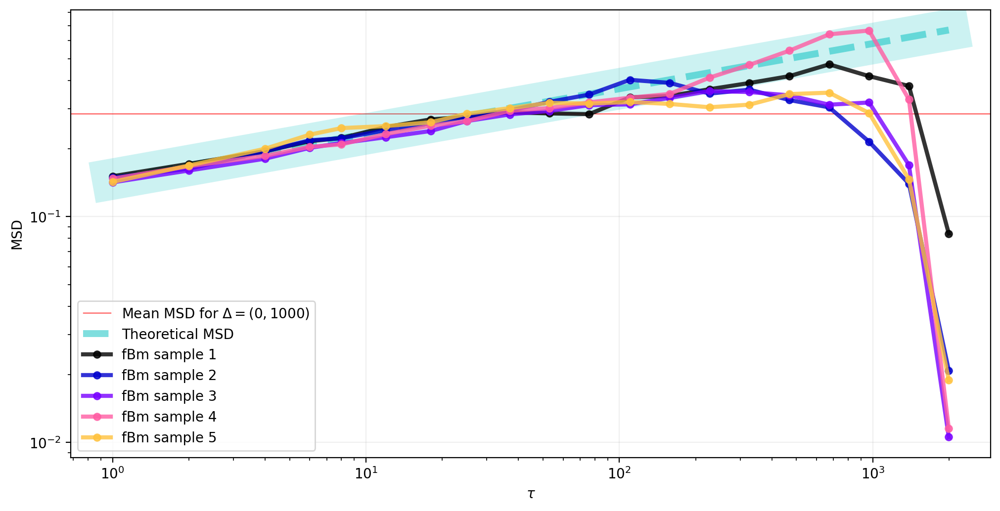

In [354]:
plt.figure(dpi = 200, figsize = (12,6))
plt.grid(alpha = 0.2)

plt.axhline(np.mean(msd_tau[:-3,:]), color = 'r', ls= '-', lw = 0.5, label = 'Mean MSD for $\Delta=(0,1000)$')
plt.plot(delta_vals, MSD_theo/k, 'c-', lw = 30, alpha = 0.2)
plt.plot(delta_vals, MSD_theo/k, 'c--', lw = 5, alpha = 0.5, label = 'Theoretical MSD')

for i_sample in range(n_samp):
    plt.plot(delta_vals, msd_tau[:,i_sample], '.-', alpha = 0.8, ms = 10, lw = 3,
             label = "fBm sample %d" % (i_sample+1),
             color = plt.cm.gnuplot2(i_sample/5))
    
plt.minorticks_on()
plt.xscale("log")
plt.yscale("log")
plt.xlabel(r"$\tau$")
plt.ylabel("MSD")
plt.legend() 
plt.show()

For small Hurst exponent ($H = 0.1$), the MSD steadily increased but roughly stayed on around the same value (red broken line which is the average MSD) across the five fBm samples. This agrees with the discussion when plotting the PDFs that the displacements of fluctuations remain fairly consistent regardless of the lag time. 

Fitting the theoretical MSD given by

\begin{equation}
MSD_{theoretical} = \frac{t^{2H}}{2H[\Gamma(H+\frac{1}{2})]^2}
\end{equation}

where $t$ is the respective lag time, we can see how the simulated fBm samples' empirical MSD is in close correspondence with the theoretical MSD fit (in cyan line).

### Automate Plotting for different H values

In [349]:
n_delta_init = 22
logdelta_min = 0
logdelta_max = 3.3
delta_vals = np.unique(np.floor(np.logspace(logdelta_min, logdelta_max, n_delta_init))).astype(int)
delta_vals

def plot_MSD_fBm(n_samp, H_n, delta_vals):
    
    n_tau = len(delta_vals)
    dx_tau = np.empty((M, n_tau, n_samp))*np.nan
    msd_tau = np.empty((n_tau, n_samp))*np.nan

    for i_sample in range(n_samp):
        for i, tau in tqdm(enumerate(delta_vals)):
            test_data = fBm_simulations[i_sample][:, H_n]
            test_dx = get_sample_dx(test_data, tau)
            dx_tau[:len(test_dx), i, i_sample] = test_dx
            dx2_sum = np.nansum(test_dx**2) # returns sum treating NaNs as zero
            denom = M-delta_vals[i]
            msd_tau[i, i_sample] = dx2_sum/denom
            
    MSD_theo = msd_theo_fbm_N(delta_vals, Hval[H_n], M)
    k = MSD_theo[1]/msd_tau[:,i_sample][1] #scaling factor
    plt.plot(delta_vals, MSD_theo/k, 'c-', lw = 20, alpha = 0.2)
    plt.plot(delta_vals, MSD_theo/k, 'c--', lw = 3, alpha = 0.5, label = 'Theoretical MSD')

    plt.grid(alpha = 0.2)
    for i_sample in range(n_samp):
        plt.plot(delta_vals, msd_tau[:,i_sample], '.-', alpha = 0.5, ms = 3, lw = 2,
                 label = "fBm sample %d"  % (i_sample+1), color = plt.cm.plasma(H_n*0.2+(0.04*i_sample)))
        
    plt.minorticks_on()
    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel(r"$\tau$")
    plt.ylabel("MSD")
    plt.title("H=%.2f" % Hval[H_n])
    plt.legend()

20it [00:00, 15130.97it/s]
20it [00:00, 7703.75it/s]
20it [00:00, 10292.77it/s]
20it [00:00, 10504.14it/s]
20it [00:00, 7451.90it/s]
20it [00:00, 12852.16it/s]
20it [00:00, 9333.12it/s]
20it [00:00, 8396.16it/s]
20it [00:00, 7127.72it/s]
20it [00:00, 10101.89it/s]
20it [00:00, 7303.97it/s]
20it [00:00, 8355.19it/s]
20it [00:00, 8224.13it/s]
20it [00:00, 7712.95it/s]
20it [00:00, 10477.90it/s]
20it [00:00, 10510.72it/s]
20it [00:00, 10723.01it/s]
20it [00:00, 8318.73it/s]
20it [00:00, 9169.88it/s]
20it [00:00, 10905.63it/s]
20it [00:00, 10438.79it/s]
20it [00:00, 8058.22it/s]
20it [00:00, 11104.86it/s]
20it [00:00, 10070.36it/s]
20it [00:00, 9264.06it/s]


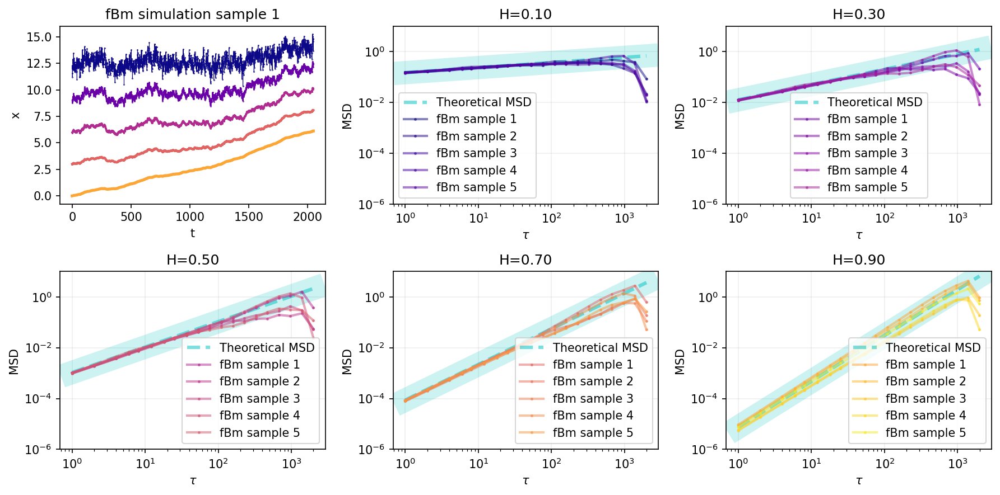

In [350]:
# generate plot for 1 sample
i_samp = 0 # select sample to plot (by index)
plt.figure(dpi = 150, figsize = (12,6))
plt.subplot(2,3,1)
for i in np.arange(len(Hval)):
    plt.plot(fBm_simulations[i_samp][:, i], label="H=%.1f" % Hval[i], 
             marker = '.', ls = '-', lw = 0.5*(i+1), ms = 0.7,
             color = plt.cm.plasma(i/5))
plt.xlabel("t")
plt.ylabel("x")
plt.title("fBm simulation sample " + str(i_samp+1))
# plt.legend(ncol=3)

for i in np.arange(5):
    plt.subplot(2,3,i+2)
    plot_MSD_fBm(n_samp = 5, H_n = i, delta_vals = delta_vals)    
    plt.ylim(1e-6,10)
    
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.5, wspace=0.5)
plt.tight_layout()
plt.show()

Plotting the MSD for H values, we can see a steady increase in the slope which agrees with the observation when plotting the PDFs. The samples in the subdiffusive regime has a fairly consistent in MSD despite the lag time. Meanwhile, the samples in the superdiffusive regime starts with very small displacements and increases in MSD with higher lag times, which manifests as a linearly increasing behaviour in the MSD log-log plots.

Across all the samples for all Hurst exponents, the MSD closely falls within the theoretical expectation as shown by the overlaid cyan lines. 

# Application on Black Marble NTL dataset

### Importing Libraries

In [430]:
from tqdm import tqdm
import itertools
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')
from matplotlib import gridspec
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import datetime
from scipy.stats import norm, describe

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

### Loading extracted NTL data

In [431]:
data_path = "../Project/data/VNP46A2_Regional/NCR_NTL_VNP46A2.csv"

### Read saved CSV file

In [432]:
data = pd.read_csv(data_path, parse_dates=True, index_col = 0)
data.head()

,DNB_BRDF_Corrected_NTL,DNB_Lunar_Irradiance,Gap_Filled_DNB_BRDF_Corrected_NTL,Latest_High_Quality_Retrieval,Mandatory_Quality_Flag,QF_Cloud_Mask,Snow_Flag
date,,,,,,,
2012-01-19,21.733953,0.5,21.923586,0.033966,0.014491,18.793525,0.0
2012-01-20,28.488267,0.5,27.802954,0.049842,0.079840,37.635675,0.0
2012-01-21,19.911453,0.5,21.199934,0.216042,0.014784,65.977834,0.0
2012-01-22,18.401624,0.5,18.264756,0.016959,0.006436,47.463276,0.0
2012-01-23,18.080945,0.5,17.632629,0.306467,0.439113,55.778030,0.0


In [433]:
data.index

DatetimeIndex(['2012-01-19', '2012-01-20', '2012-01-21', '2012-01-22',
               '2012-01-23', '2012-01-24', '2012-01-25', '2012-01-26',
               '2012-01-27', '2012-01-28',
               ...
               '2023-06-02', '2023-06-03', '2023-06-04', '2023-06-05',
               '2023-06-06', '2023-06-07', '2023-06-08', '2023-06-09',
               '2023-06-10', '2023-06-11'],
              dtype='datetime64[ns]', name='date', length=4142, freq=None)

In [434]:
n_init = len(data)
print("Size of original dataset: %d" % n_init)

Size of original dataset: 4142


### Descriptive statistics

In [435]:
data.describe()

,DNB_BRDF_Corrected_NTL,DNB_Lunar_Irradiance,Gap_Filled_DNB_BRDF_Corrected_NTL,Latest_High_Quality_Retrieval,Mandatory_Quality_Flag,QF_Cloud_Mask,Snow_Flag
count,2670.000000,4107.000000,4107.000000,4107.000000,2670.000000,4107.000000,4083.000000
mean,22.044298,26.312285,23.818935,3.993595,0.447146,371.321069,0.000673
std,7.017390,36.803359,3.226065,4.479393,0.698937,294.696914,0.012084
min,0.032562,0.500000,4.203769,0.003160,0.000000,3.080248,0.000000
25%,18.622556,0.500000,22.083439,1.072860,0.013410,61.538253,0.000000
50%,22.592008,0.500000,24.217076,2.373474,0.049517,297.811024,0.000000
75%,26.418989,44.950000,25.753041,5.256165,0.600256,728.083553,0.000000
max,73.589233,164.198530,35.925257,28.598642,2.000000,753.366582,0.369491


## Plotting the timeseries data



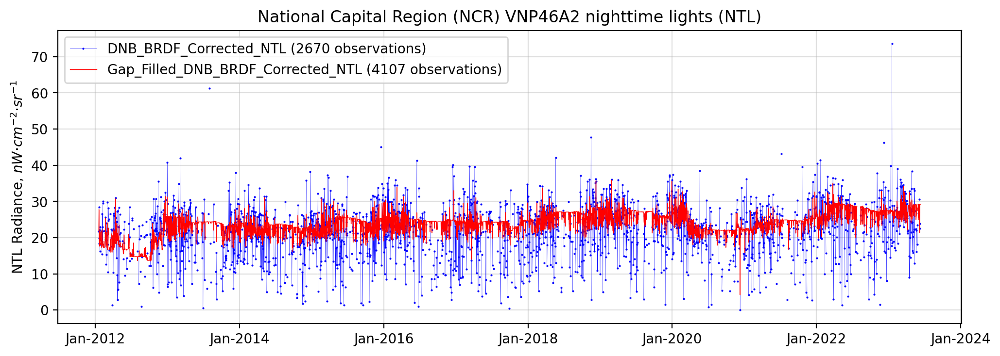

In [436]:
plt.figure(dpi = 200, figsize = (12,4))
plt.grid(alpha = 0.4)

NTL = data['DNB_BRDF_Corrected_NTL']
NTL_GF = data['Gap_Filled_DNB_BRDF_Corrected_NTL']

plt.plot(NTL, 'b.-', lw = 0.2, ms = 1,
         label = 'DNB_BRDF_Corrected_NTL (' + str(NTL.count()) + ' observations)')
plt.plot(NTL_GF, 'r-', lw = 0.5,
         label = 'Gap_Filled_DNB_BRDF_Corrected_NTL (' + str(NTL_GF.count()) + ' observations)')
plt.ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')

plt.title('National Capital Region (NCR) VNP46A2 nighttime lights (NTL)')

plt.gcf().autofmt_xdate
dtFmt = mdates.DateFormatter("%b-%Y") # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.legend()
plt.show()

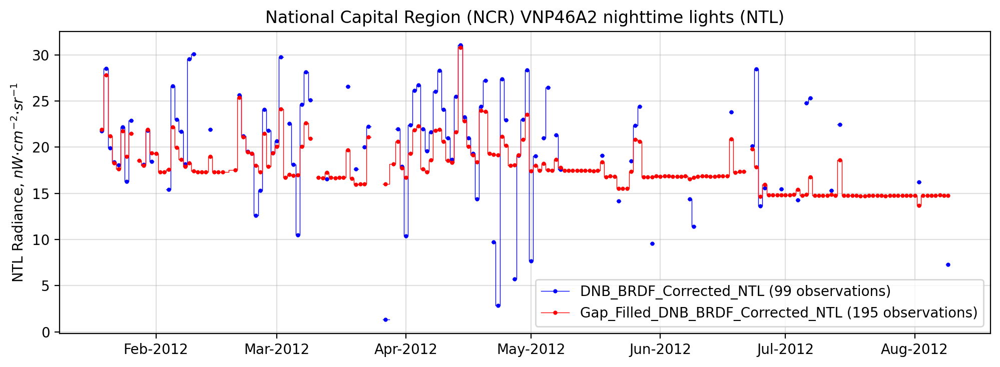

In [437]:
view = 200

plt.figure(dpi = 200, figsize = (12,4))
plt.grid(alpha = 0.4)

NTL_ = data['DNB_BRDF_Corrected_NTL'][:view]
NTL_GF_ = data['Gap_Filled_DNB_BRDF_Corrected_NTL'][:view]

plt.plot(NTL_, 'bo-', lw = 0.5, ms = 2, drawstyle = 'steps-mid',
         label = 'DNB_BRDF_Corrected_NTL (' + str(NTL_.count()) + ' observations)')
plt.plot(NTL_GF_, 'ro-', lw = 0.5,  ms = 2, drawstyle = 'steps-mid',
         label = 'Gap_Filled_DNB_BRDF_Corrected_NTL (' + str(NTL_GF_.count()) + ' observations)')
plt.ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')

plt.title('National Capital Region (NCR) VNP46A2 nighttime lights (NTL)')

plt.gcf().autofmt_xdate
dtFmt = mdates.DateFormatter("%b-%Y") # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.legend()
plt.show()

### Missing datapoints

In [438]:
date_range = pd.date_range(start='2012-01-19', end='2023-06-12', freq='D')
NTL_reindexed = NTL.reindex(date_range)
NTL_GF_reindexed = NTL_GF.reindex(date_range)

NTL_missing_dates = NTL_reindexed[NTL_reindexed.isna()]
NTL_GF_missing_dates = NTL_GF_reindexed[NTL_GF_reindexed.isna()]


In [439]:
missing_days = len(date_range) - NTL_GF.count()
cloud_contaminated =  NTL.count() - missing_days

In [440]:
print("Of the " + str(len(date_range)) + " days, " + str(missing_days)+" observations are missing.")
print("Meanwhile, "+ str(cloud_contaminated) + " days are cloud contaminated, hence, gap-filled.")

Of the 4163 days, 56 observations are missing.
Meanwhile, 2614 days are cloud contaminated, hence, gap-filled.


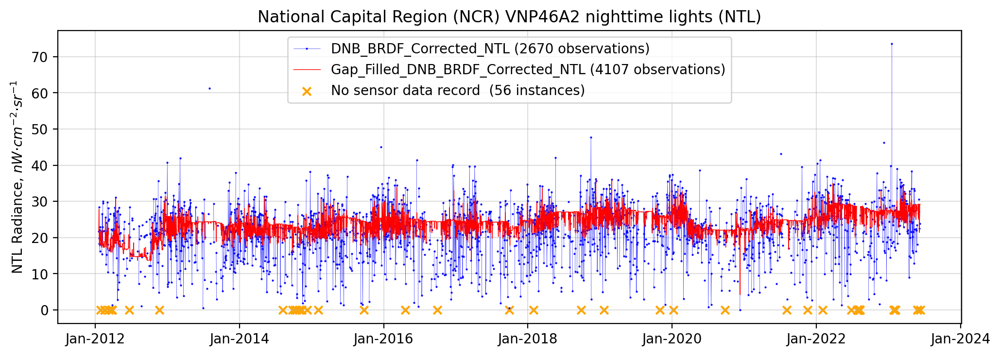

In [441]:
plt.figure(dpi = 200, figsize = (12,4))
plt.grid(alpha = 0.4)


plt.plot(NTL, 'b.-', lw = 0.2, ms = 1,
         label = 'DNB_BRDF_Corrected_NTL (' + str(NTL.count()) + ' observations)')
plt.plot(NTL_GF, 'r-', lw = 0.5,
         label = 'Gap_Filled_DNB_BRDF_Corrected_NTL (' + str(NTL_GF.count()) + ' observations)')
plt.ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')

plt.title('National Capital Region (NCR) VNP46A2 nighttime lights (NTL)')

plt.gcf().autofmt_xdate
dtFmt = mdates.DateFormatter("%b-%Y") # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.scatter(NTL_GF_missing_dates.index, [0] * len(NTL_GF_missing_dates), color='orange', marker='x',
            label='No sensor data record  (' + str(missing_days) + ' instances)')
plt.legend()
plt.show()


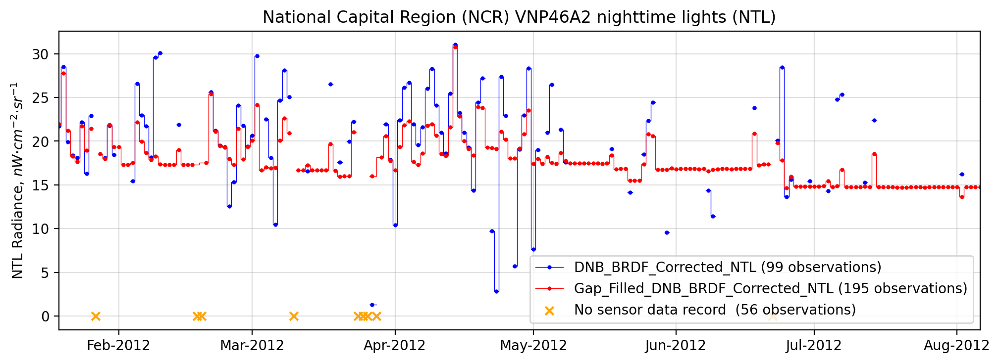

In [442]:
view = 200

plt.figure(dpi = 200, figsize = (12,4))
plt.grid(alpha = 0.4)

plt.plot(NTL_, 'bo-', lw = 0.5, ms = 2, drawstyle = 'steps-mid',
         label = 'DNB_BRDF_Corrected_NTL (' + str(NTL_.count()) + ' observations)')
plt.plot(NTL_GF_, 'ro-', lw = 0.5,  ms = 2, drawstyle = 'steps-mid',
         label = 'Gap_Filled_DNB_BRDF_Corrected_NTL (' + str(NTL_GF_.count()) + ' observations)')
plt.ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')

plt.title('National Capital Region (NCR) VNP46A2 nighttime lights (NTL)')

plt.gcf().autofmt_xdate
dtFmt = mdates.DateFormatter("%b-%Y") # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis


plt.scatter(NTL_GF_missing_dates.index, [0] * len(NTL_GF_missing_dates[:view]), color='orange', marker='x',
            label='No sensor data record  (' + str(missing_days) + ' observations)')
plt.xlim(date_range[0], date_range[view])
plt.legend()
plt.show()

## Generating PDFs

In [443]:
data_sample = NTL_GF
n = len(data_sample)

We select τ = 7 (weekly scale)

In [444]:
tau = 7 #7 days
dt = 1 #1 day interval

delta = int(np.round(tau/dt))
print("tau: %d, Delta: %d" % (tau, delta))

tau: 7, Delta: 7


In [445]:
data_trunc = data_sample[:-1*delta]
data_shift = data_sample[delta:]
dx = data_shift.values - data_trunc.values
len(dx), len(data_trunc), len(data_shift)

(4135, 4135, 4135)

In [446]:
data_trunc.head(), data_shift.head()

(date
 2012-01-19    21.923586
 2012-01-20    27.802954
 2012-01-21    21.199934
 2012-01-22    18.264756
 2012-01-23    17.632629
 Name: Gap_Filled_DNB_BRDF_Corrected_NTL, dtype: float64,
 date
 2012-01-26    21.449830
 2012-01-27          NaN
 2012-01-28    18.568147
 2012-01-29    17.997314
 2012-01-30    21.906167
 Name: Gap_Filled_DNB_BRDF_Corrected_NTL, dtype: float64)

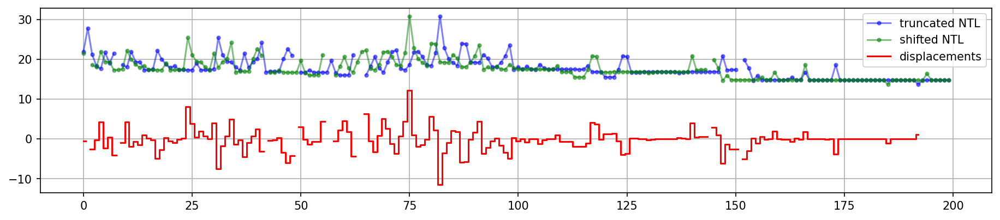

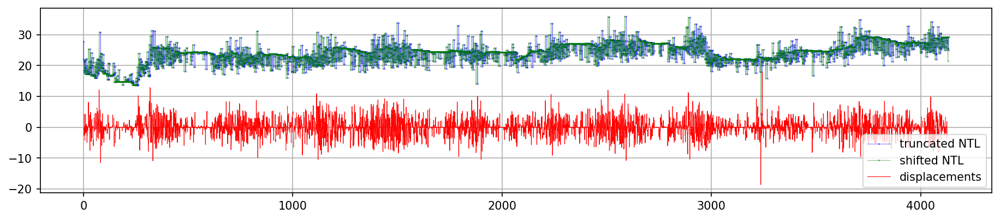

In [447]:
view = 200
plt.figure(dpi = 150, figsize = (15,3))
plt.grid()
plt.plot(data_trunc[:view].values, 'b.-', alpha = 0.5, label = 'truncated NTL')
plt.plot(data_shift[:view].values, 'g.-', alpha = 0.5, label = 'shifted NTL')
plt.plot(dx[:view-tau], drawstyle = 'steps-mid', color = 'red', label = 'displacements')
plt.legend()
plt.show()

plt.figure(dpi = 150, figsize = (15,3))
plt.grid()
plt.plot(data_trunc.values, 'b.-', alpha = 0.5, ms = 1, lw = 0.5, label = 'truncated NTL')
plt.plot(data_shift.values, 'g.-', alpha = 0.5, ms = 1, lw = 0.5, label = 'shifted NTL')
plt.plot(dx[:-tau], drawstyle = 'steps-mid', lw = 0.5, color = 'red', label = 'displacements')
plt.legend()
plt.show()

Text(0.5, 1.0, 'Lag time: $\\Delta=$7 days')

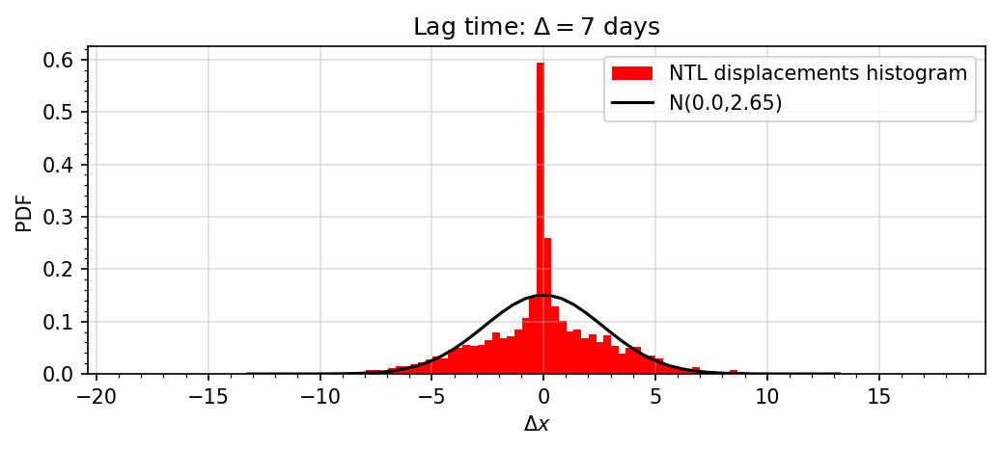

In [448]:
# Generate normal distribution
xx_sd = np.sqrt(tau)
xx = np.linspace(-5, 5)*xx_sd # gridded points from -5 to 5 in units of sd
xx_mean = 0.
yy = norm.pdf(xx, xx_mean, xx_sd)

plt.figure(figsize=(8,3), dpi = 150)
plt.grid(alpha = 0.4)
# Plot PDF of displacements
plt.hist(dx, density=True, bins="auto", label="NTL displacements histogram", color = 'red')
plt.xlabel("Delta x")
plt.ylabel("PDF")

# # Overlay normal distribution
plt.plot(xx, yy, 'k-', label="N(%.1f,%.2f)" % (xx_mean, xx_sd))
plt.ylabel("PDF")
plt.xlabel(r"$\Delta x$")
plt.legend(loc="best")

plt.minorticks_on()
plt.xlabel(r"$\Delta x$")
plt.ylabel("PDF")
plt.title(r"Lag time: $\Delta=$%d days" % (tau))

### Relevant Lag times (1,   4,   7,  14,  21,  30,  90, 365)

In [449]:
tau_vals = np.array([1, 4, 7, 14, 21, 30, 90, 365])
delta_vals = np.round(tau_vals/dt).astype(int)
delta_vals

array([  1,   4,   7,  14,  21,  30,  90, 365])

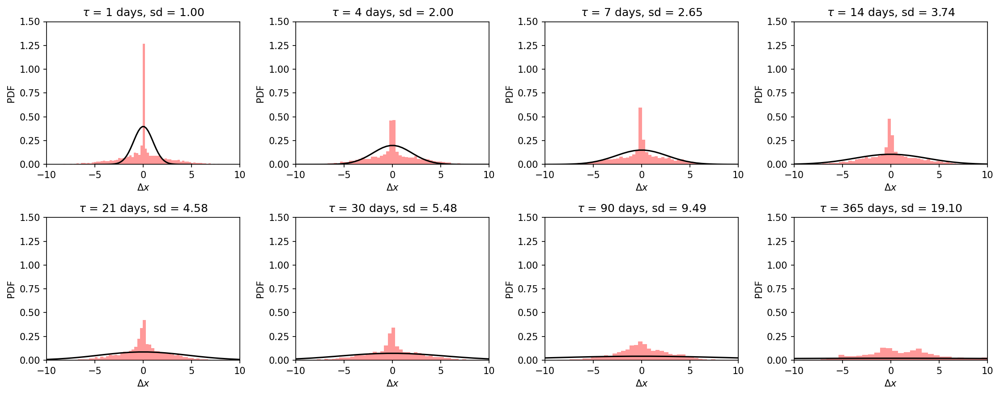

In [453]:
n_samp = 1
n_tau = len(tau_vals)
dx_tau = np.empty((n, n_tau))*np.nan #storing the displacements

for i, tau in enumerate(tau_vals):
    delta = delta_vals[i]
    data_trunc = data_sample[:-1*delta]
    data_shift = data_sample[delta:]
    dx = data_shift.values - data_trunc.values
    dx_tau[:len(dx), i] = dx.T

def plot_pdf_bm(dx, tau):
    xx_mean = 0.
    xx_sd = np.sqrt(tau)
    xx = np.linspace(-5, 5)*xx_sd # gridded points from -5 to 5 in units of sd
    yy = norm.pdf(xx, xx_mean, xx_sd)
    plt.hist(dx, density=True, bins="auto", label="BM", alpha=0.4, color = 'red')
    plt.xlabel("Delta x")
    plt.ylabel("PDF")
    plt.plot(xx, yy, 'k-', label="N(%.1f,%.2f)" % (xx_mean, xx_sd))
    plt.ylabel("PDF")
    plt.xlabel(r"$\Delta x$")
    plt.title(r"$\tau$ = %d days, sd = %.2f" % (tau, xx_sd))
    plt.xlim(-10,10)
    plt.ylim(0,1.5)


i_samp = 0
plt.figure(figsize=(15,6), dpi = 150)
for i in np.arange(n_tau):
    plt.subplot(2,4,i+1)
    plot_pdf_bm(dx_tau[:,i], delta_vals[i])
    plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.5, wspace=0.5)

# plt.xlim(-10,10)
plt.tight_layout()

### Log-spaced time intervals (1,    3,   10,   31,  100,  316, 1000, 3162)

In [395]:
n_delta_init = 8 # later, can increase this
logdelta_min = 0
logdelta_max = 3.5
delta_vals = np.unique(np.floor(np.logspace(logdelta_min, logdelta_max, n_delta_init))).astype(int)
delta_vals

array([   1,    3,   10,   31,  100,  316, 1000, 3162])

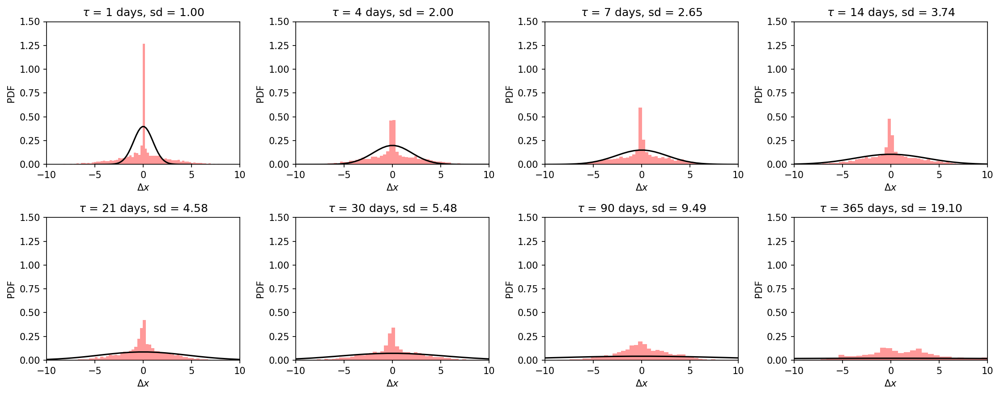

In [454]:
n_samp = 1
n_tau = len(tau_vals)
dx_tau = np.empty((n, n_tau))*np.nan #storing the displacements

for i, tau in enumerate(delta_vals):
    delta = delta_vals[i]
    data_trunc = data_sample[:-1*delta]
    data_shift = data_sample[delta:]
    dx = data_shift.values - data_trunc.values
    dx_tau[:len(dx), i] = dx.T

def plot_pdf_bm(dx, tau):
    xx_mean = 0.
    xx_sd = np.sqrt(tau)
    xx = np.linspace(-5, 5)*xx_sd # gridded points from -5 to 5 in units of sd
    yy = norm.pdf(xx, xx_mean, xx_sd)
    plt.hist(dx, density=True, bins="auto", label="BM", alpha=0.4, color = 'red')
    plt.xlabel("Delta x")
    plt.ylabel("PDF")
    plt.plot(xx, yy, 'k-', label="N(%.1f,%.2f)" % (xx_mean, xx_sd))
    plt.ylabel("PDF")
    plt.xlabel(r"$\Delta x$")
    plt.title(r"$\tau$ = %d days, sd = %.2f" % (tau, xx_sd))
    plt.xlim(-10,10)
    plt.ylim(0,1.5)

i_samp = 0
plt.figure(figsize=(15,6), dpi = 150)
for i in np.arange(n_tau):
    plt.subplot(2,4,i+1)
    plot_pdf_bm(dx_tau[:,i], delta_vals[i])
    plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.5, wspace=0.5)
plt.tight_layout()

## Generating MSDs

### Discrete Lag Times

In [397]:
n_delta_init = 30 # later, can increase this
logdelta_min = 0
logdelta_max = 3.5
delta_vals = np.unique(np.floor(np.logspace(logdelta_min, logdelta_max, n_delta_init))).astype(int)
delta_vals

n = len(data)
n_samp = 1
n_tau = len(delta_vals)
dx_tau = np.empty((n, n_tau))*np.nan
for i, tau in tqdm(enumerate(delta_vals)):
    delta = delta_vals[i]
    data_trunc = data_sample[:-1*delta]
    data_shift = data_sample[delta:]
    dx = data_shift.values - data_trunc.values
    dx_tau[:len(dx), i] = dx.T

28it [00:00, 4160.43it/s]


In [398]:
msd_tau = np.empty((n_tau, n_samp))*np.nan
for i, tau in enumerate(delta_vals):
    dx2_sum = np.nansum(dx_tau[:, i]**2) # returns sum treating NaNs as zero
    denom = n-delta_vals[i]
    msd_tau[i, i_samp] = dx2_sum/denom

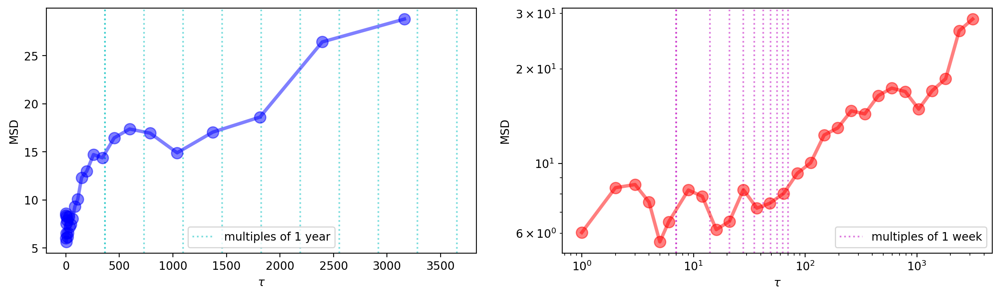

In [399]:
plt.figure(dpi = 200, figsize = (15,4))
plt.subplot(121)
for year in np.arange(1,11)*365: plt.axvline(year, ls=':', color = 'c', alpha = 0.5)
plt.axvline(365, ls=':', color = 'c', alpha = 0.5, label = 'multiples of 1 year')
plt.plot(delta_vals, msd_tau, 'bo-', alpha = 0.5,  ms = 10, lw = 3)
plt.xlabel(r"$\tau$")
plt.ylabel("MSD")
plt.legend()

plt.subplot(122)
for year in np.arange(1,11)*7: plt.axvline(year, ls=':', color = 'm', alpha = 0.5)
plt.axvline(7, ls=':', color = 'm', alpha = 0.5, label = 'multiples of 1 week')
plt.plot(delta_vals, msd_tau, 'ro-', alpha = 0.5, ms = 10, lw = 3)
msd_theo = tau_vals
plt.xscale("log")
plt.yscale("log")
plt.xlabel(r"$\tau$")
plt.ylabel("MSD")
plt.legend()
plt.show()

Here we can see a particular periodicity in the MSD plots, however, take note that we are using a discretize set of delta values that are log-spaced. NTL is an output of a complex system of nocturnal lighting from artificial and natural sources hence, I reckon that each timescale (and thus lag-time) must be investigated by plotting its corresponding MSD.

### Continuous Lag Times

4142it [00:00, 17146.86it/s]


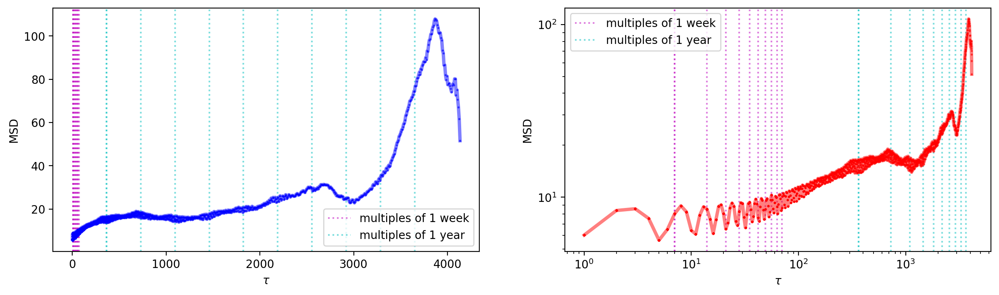

In [423]:
n_tau = len(data_sample)
tau_vals = np.logspace(0,np.log10(n_tau), n_tau)
delta_vals = np.round(tau_vals/dt).astype(int)

n = len(data)
n_samp = 1
n_tau = len(tau_vals)
dx_tau = np.empty((n, n_tau))*np.nan
for i, tau in tqdm(enumerate(tau_vals)):
    delta = delta_vals[i]
    data_trunc = data_sample[:-1*delta]
    data_shift = data_sample[delta:]
    dx = data_shift.values - data_trunc.values
    dx_tau[:len(dx), i] = dx.T
    
msd_tau = np.empty((n_tau, n_samp))*np.nan
for i, tau in enumerate(tau_vals):
    dx2_sum = np.nansum(dx_tau[:, i]**2) # returns sum treating NaNs as zero
    denom = n-delta_vals[i]
    msd_tau[i, i_samp] = dx2_sum/denom

plt.figure(dpi = 200, figsize = (15, 4))

plt.subplot(121)
for year in np.arange(1,11)*7: plt.axvline(year, ls=':', color = 'm', alpha = 0.5)
plt.axvline(7, ls=':', color = 'm', alpha = 0.5, label = 'multiples of 1 week')
for year in np.arange(1,11)*365: plt.axvline(year, ls=':', color = 'c', alpha = 0.5)
plt.axvline(365, ls=':', color = 'c', alpha = 0.5, label = 'multiples of 1 year')


plt.plot(delta_vals, msd_tau, 'bo-', alpha = 0.5,  ms = 1, lw = 3)
plt.xlabel(r"$\tau$")
plt.ylabel("MSD")
plt.legend()

plt.subplot(122)
for year in np.arange(1,11)*7: plt.axvline(year, ls=':', color = 'm', alpha = 0.5)
plt.axvline(7, ls=':', color = 'm', alpha = 0.5, label = 'multiples of 1 week')
for year in np.arange(1,11)*365: plt.axvline(year, ls=':', color = 'c', alpha = 0.5)
plt.axvline(365, ls=':', color = 'c', alpha = 0.5, label = 'multiples of 1 year')


plt.plot(delta_vals, msd_tau, 'ro-', alpha = 0.5, ms = 1, lw = 3)
msd_theo = tau_vals
plt.xscale("log")
plt.yscale("log")
plt.xlabel(r"$\tau$")
plt.ylabel("MSD")
plt.legend()
plt.show()

Markers indicating multiples of the week and year are displayed as the magenta and cyan lines, respectively. Noticeably, a linear and exponential regime in the MSD is evident in the weekly and yearly timescales.

### Automating the plots

In [407]:
def MSD_plotted(data):
    plt.figure(dpi = 150, figsize = (15,3))
    plt.grid()
    plt.plot(data, 'g.-', drawstyle = 'steps-mid', alpha = 0.5, ms = 1, lw = 1)
    plt.text(datetime.date(2012, 1, 19), data.mean(), str(data.describe()),
             fontsize=7, bbox=dict(facecolor='white', alpha=0.8))
    plt.ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')

    n_tau = len(data)
    tau_vals = np.logspace(0,np.log10(n_tau), n_tau)
    delta_vals = np.round(tau_vals/dt).astype(int)

    n = len(data)
    n_samp = 1
    n_tau = len(tau_vals)
    dx_tau = np.empty((n, n_tau))*np.nan

    for i, tau in tqdm(enumerate(tau_vals)):
        delta = delta_vals[i]
        data_trunc = data[:-1*delta]
        data_shift = data[delta:]
        dx = data_shift.values - data_trunc.values
        dx_tau[:len(dx), i] = dx.T

    msd_tau = np.empty((n_tau, n_samp))*np.nan
    for i, tau in enumerate(tau_vals):
        dx2_sum = np.nansum(dx_tau[:, i]**2)
        denom = n-delta_vals[i]
        msd_tau[i, i_samp] = dx2_sum/denom

    plt.figure(dpi = 150, figsize = (15,3))

    plt.subplot(121)
    for year in np.arange(1,11)*7: plt.axvline(year, ls=':', color = 'm', alpha = 0.5)
    plt.axvline(7, ls=':', color = 'm', alpha = 0.5, label = 'multiples of 1 week')
    for year in np.arange(1,11)*365: plt.axvline(year, ls=':', color = 'c', alpha = 0.5)
    plt.axvline(365, ls=':', color = 'c', alpha = 0.5, label = 'multiples of 1 year')


    plt.plot(delta_vals, msd_tau, 'bo-', alpha = 0.5,  ms = 1, lw = 3)
    plt.xlabel(r"$\tau$")
    plt.ylabel("MSD")
    plt.legend()

    plt.subplot(122)
    for year in np.arange(1,11)*7: plt.axvline(year, ls=':', color = 'm', alpha = 0.5)
    plt.axvline(7, ls=':', color = 'm', alpha = 0.5, label = 'multiples of 1 week')
    for year in np.arange(1,11)*365: plt.axvline(year, ls=':', color = 'c', alpha = 0.5)
    plt.axvline(365, ls=':', color = 'c', alpha = 0.5, label = 'multiples of 1 year')

    plt.plot(delta_vals, msd_tau, 'ro-', alpha = 0.5, ms = 1, lw = 3)
    msd_theo = tau_vals
    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel(r"$\tau$")
    plt.ylabel("MSD")
    plt.legend()
    plt.show()

### [MSD] NTL data

4142it [00:00, 16879.24it/s]


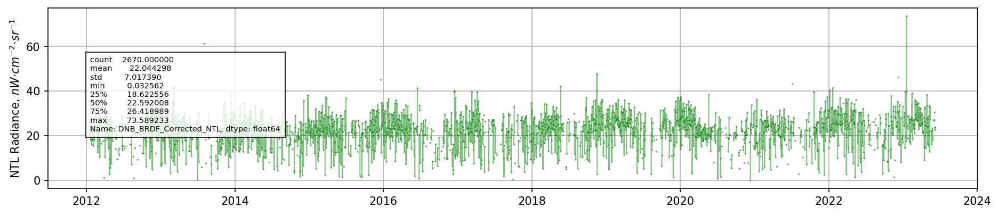

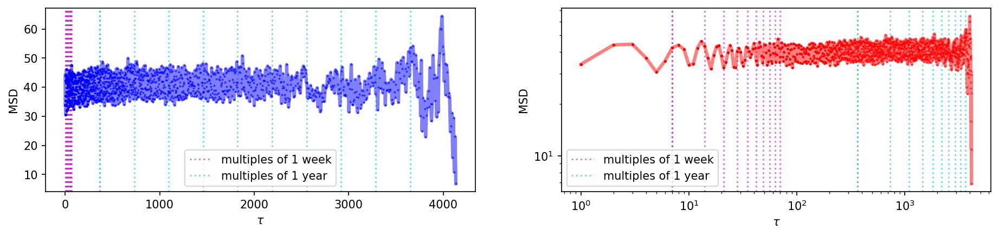

In [410]:
MSD_plotted(data['DNB_BRDF_Corrected_NTL'])

Using the untreated raw data renders a seemingly subdiffusive MSD plot, however, it's reliability is still in question especially that roughly half of the data is missing due to cloud cover. 

### [MSD] Gap Filled NTL data

4142it [00:00, 16017.03it/s]


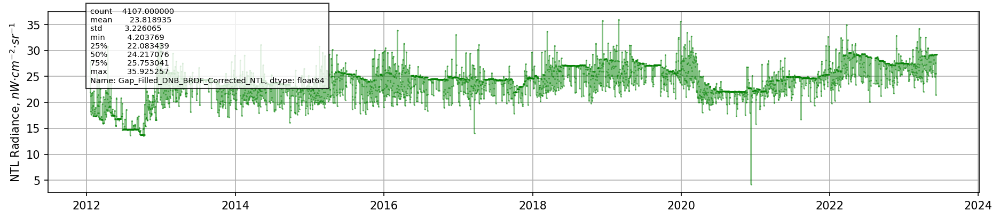

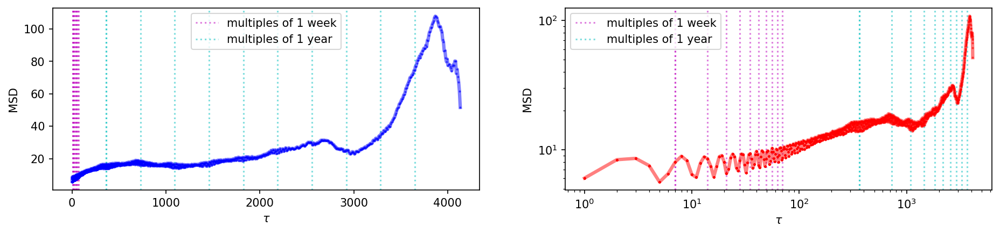

In [408]:
MSD_plotted(NTL_GF)

With Gap Filling algorithm on Black Marble, the data is now more continious and corrected for all the other effects. We can see here a periodic fluctuation in MSD but overall an increasing trend through larger lag times. NTL has been established to represent long term economic progression hence, this increase in trend is captures by setting larger values of $\tau$.

### [MSD] Lunar Irradiance data

4142it [00:00, 16672.38it/s]


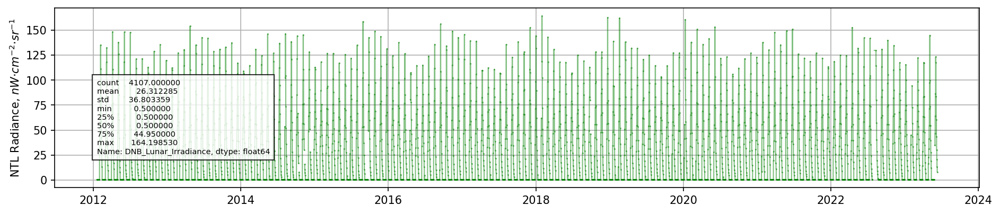

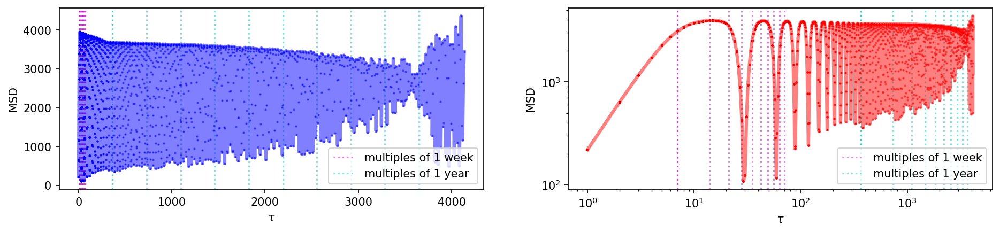

In [409]:
MSD_plotted(data['DNB_Lunar_Irradiance'])

A layer of VNP46A2 accounts for the lunar effects that is used for correction and here we can see that the MSD periodically drops on multiples of 4 weeks, which is representative of one lunar cycle. 

### [MSD] Latest High Quality Retrieval data (in unit of days)

4142it [00:00, 16910.05it/s]


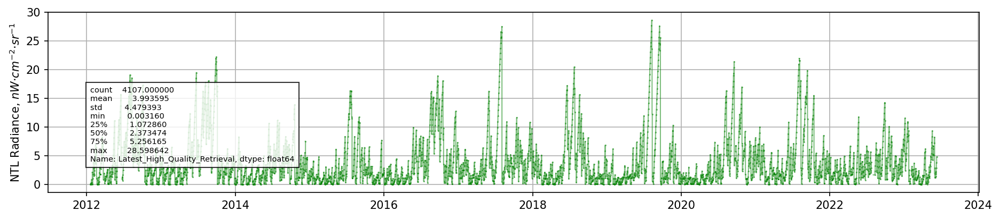

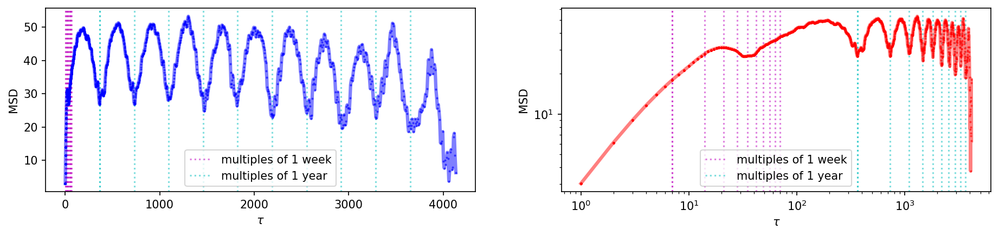

In [411]:
MSD_plotted(data['Latest_High_Quality_Retrieval'])

## MSD for Regional Gap Filled NTL data

In this portion, the MSD for the NTL values aggregated on a regional scale is shown and characteristic behaviors were observed. However, a further data processing is needed to clean some of the datasets with extreme outliers which eventually affected the MSD plots.

In [412]:
import os

data_path = "../Project/data/VNP46A2_regional/"
regional_NTL = os.listdir(data_path)
regional_NTL
# "../data/

['Region XII_NTL_VNP46A2.csv',
 'Region VI_NTL_VNP46A2.csv',
 'Region II_NTL_VNP46A2.csv',
 'ARMM_NTL_VNP46A2.csv',
 'Region IV-A_NTL_VNP46A2.csv',
 'Region I_NTL_VNP46A2.csv',
 'Region XI_NTL_VNP46A2.csv',
 'Region IX_NTL_VNP46A2.csv',
 'Region III_NTL_VNP46A2.csv',
 'NCR_NTL_VNP46A2.csv',
 'Region XIII_NTL_VNP46A2.csv',
 'Region VII_NTL_VNP46A2.csv',
 'Region VIII_NTL_VNP46A2.csv',
 'Region X_NTL_VNP46A2.csv',
 'CAR_NTL_VNP46A2.csv']

  0%|                                                    | 0/15 [00:00<?, ?it/s]

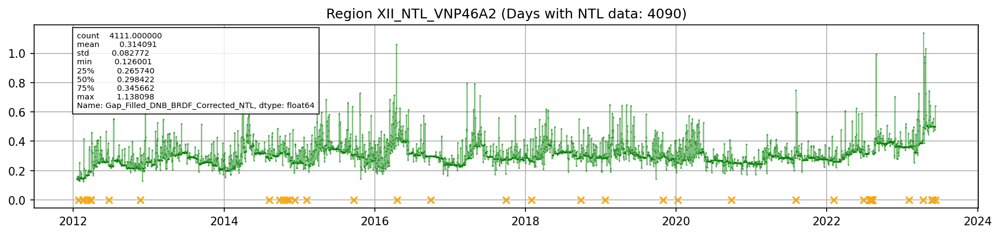


0it [00:00, ?it/s]
1303it [00:00, 13025.57it/s]
4142it [00:00, 15814.47it/s]


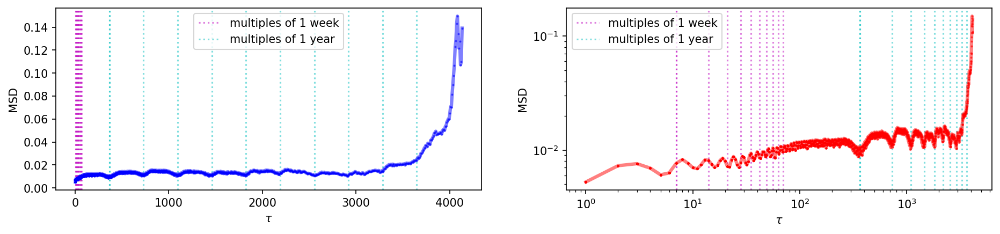

  7%|██▉                                         | 1/15 [00:01<00:15,  1.11s/it]

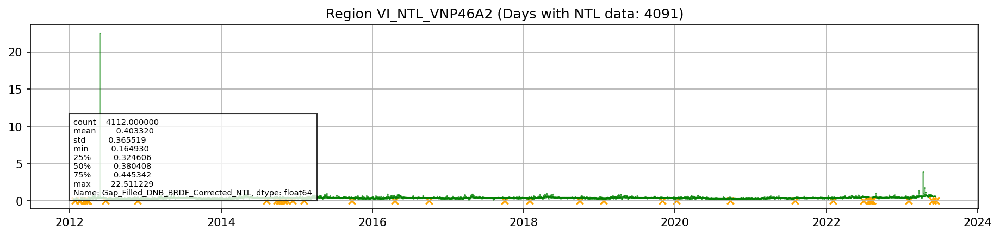


0it [00:00, ?it/s]
1360it [00:00, 13596.48it/s]
4142it [00:00, 14910.07it/s]


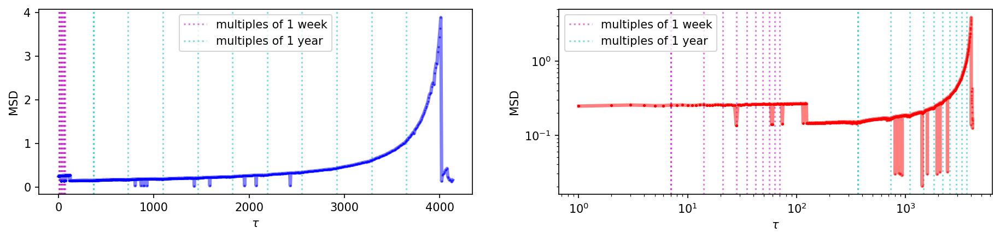

 13%|█████▊                                      | 2/15 [00:02<00:13,  1.04s/it]

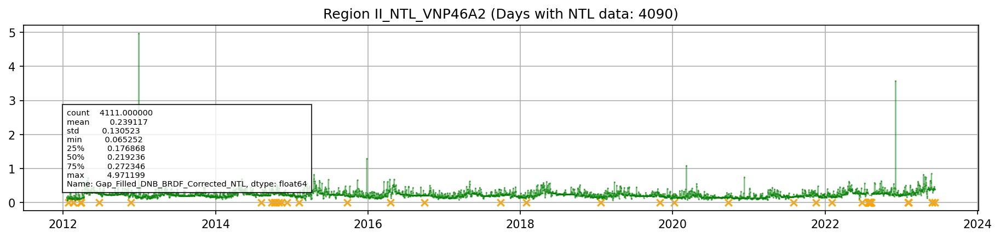


0it [00:00, ?it/s]
1501it [00:00, 15002.04it/s]
4142it [00:00, 16077.00it/s]


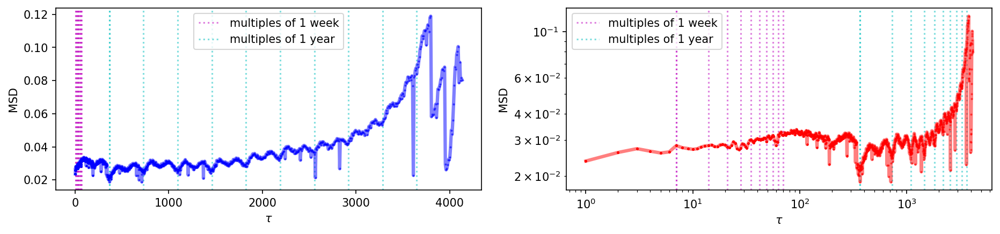

 20%|████████▊                                   | 3/15 [00:03<00:13,  1.10s/it]

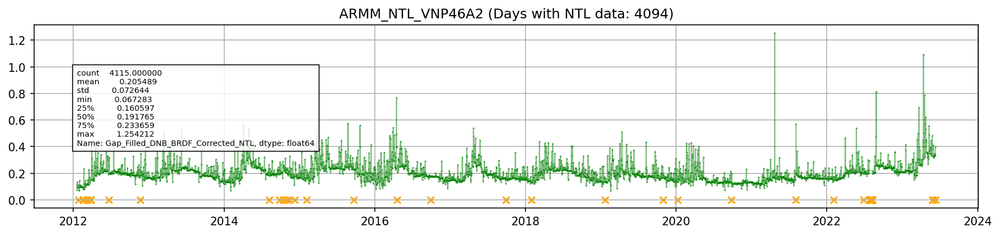


0it [00:00, ?it/s]
1707it [00:00, 17065.87it/s]
4142it [00:00, 17519.66it/s]


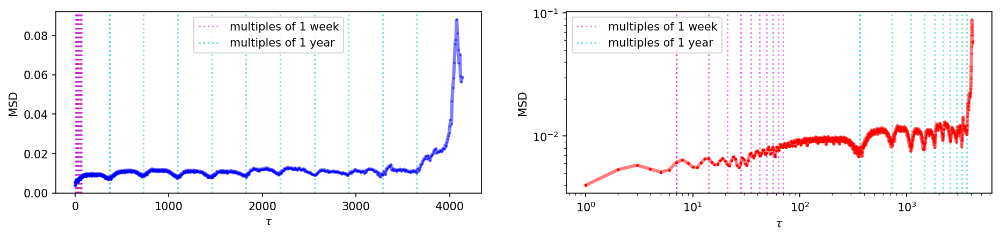

 27%|███████████▋                                | 4/15 [00:04<00:11,  1.01s/it]

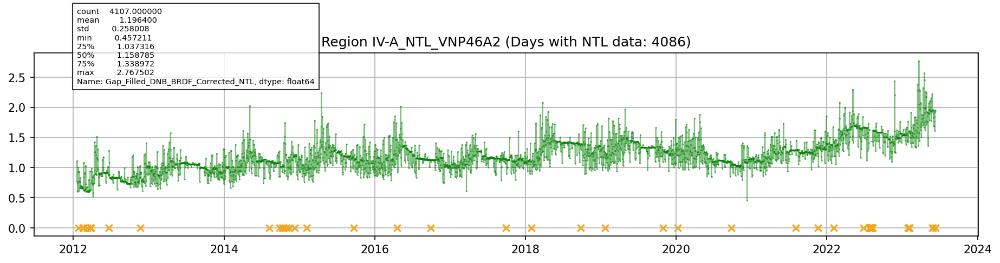


0it [00:00, ?it/s]
1531it [00:00, 15307.68it/s]
4142it [00:00, 16508.71it/s]


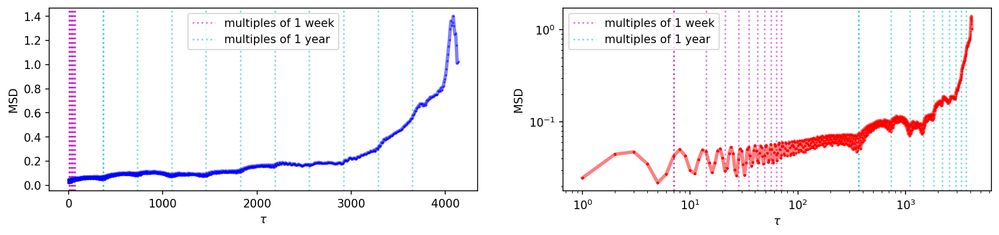

 33%|██████████████▋                             | 5/15 [00:05<00:09,  1.02it/s]

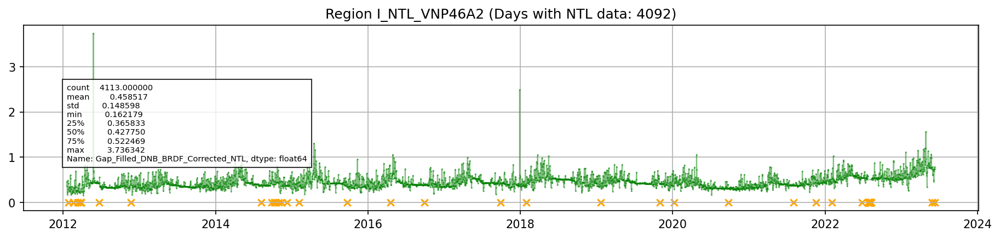


0it [00:00, ?it/s]
1495it [00:00, 14946.13it/s]
4142it [00:00, 16271.03it/s]


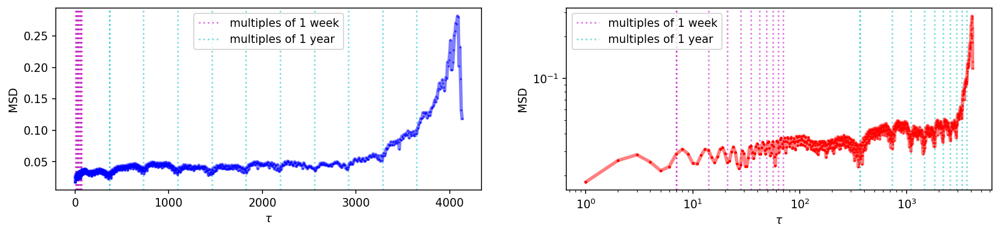

 40%|█████████████████▌                          | 6/15 [00:05<00:08,  1.04it/s]

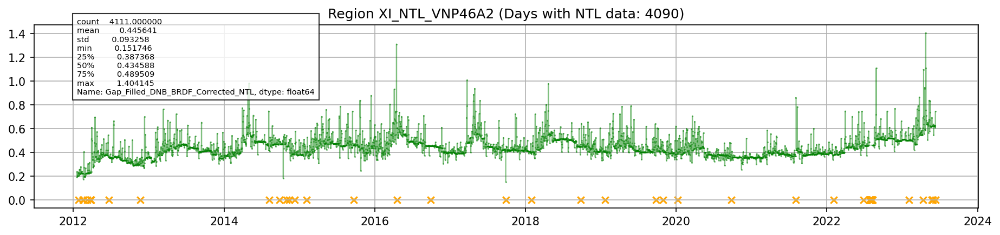


0it [00:00, ?it/s]
1469it [00:00, 14685.74it/s]
4142it [00:00, 15461.30it/s]


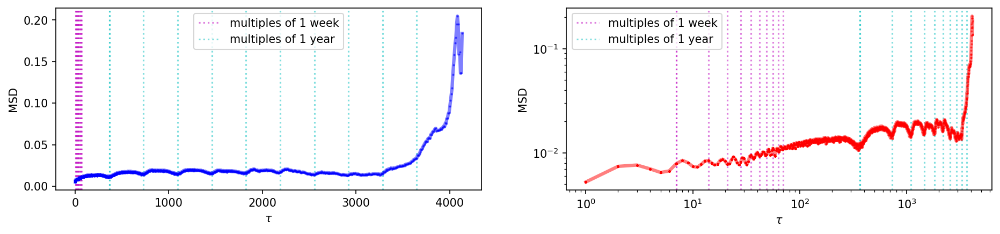

 47%|████████████████████▌                       | 7/15 [00:06<00:07,  1.04it/s]

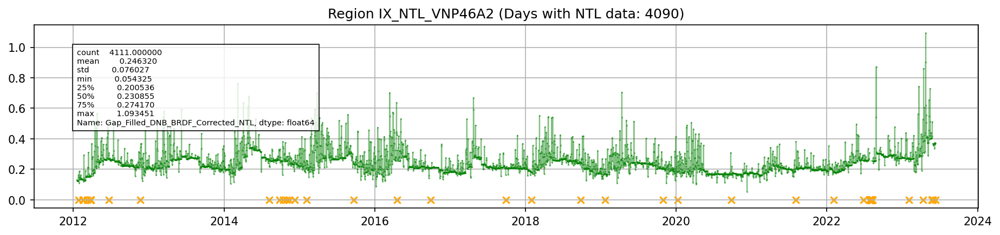


0it [00:00, ?it/s]
1395it [00:00, 13946.26it/s]
4142it [00:00, 15465.33it/s]


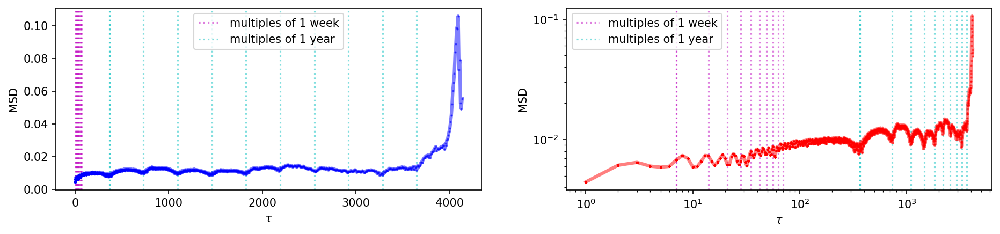

 53%|███████████████████████▍                    | 8/15 [00:08<00:07,  1.02s/it]

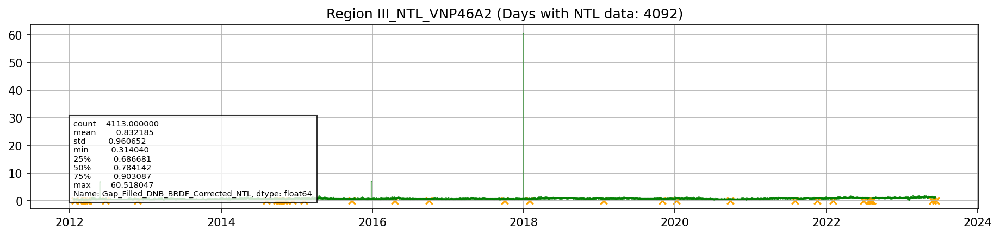


0it [00:00, ?it/s]
1407it [00:00, 14069.01it/s]
4142it [00:00, 15510.22it/s]


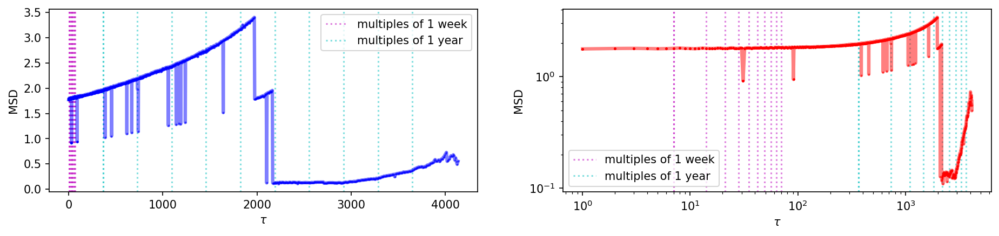

 60%|██████████████████████████▍                 | 9/15 [00:09<00:05,  1.02it/s]

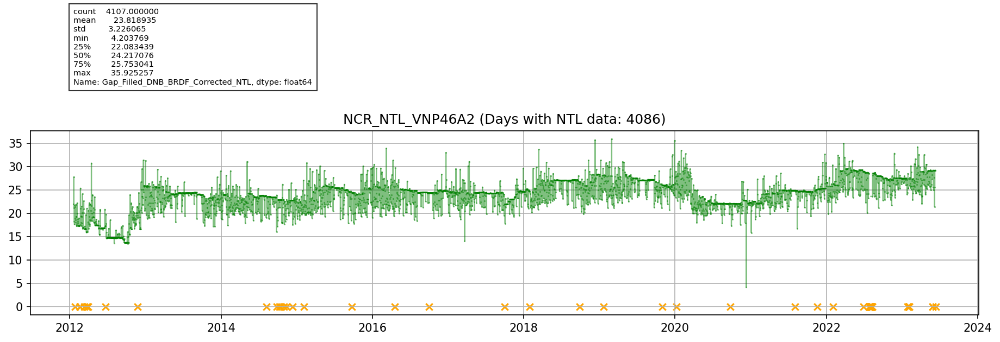


0it [00:00, ?it/s]
1571it [00:00, 15706.20it/s]
4142it [00:00, 16185.56it/s]


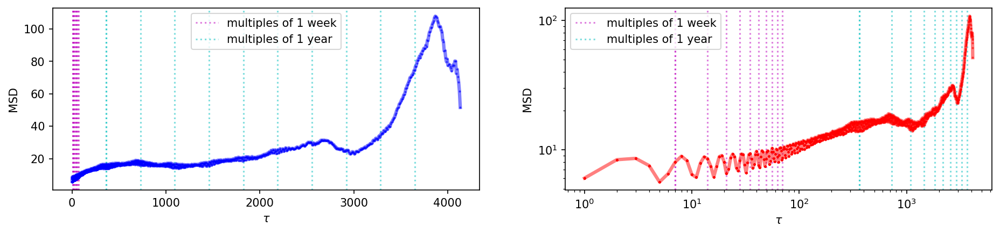

 67%|████████████████████████████▋              | 10/15 [00:09<00:04,  1.03it/s]

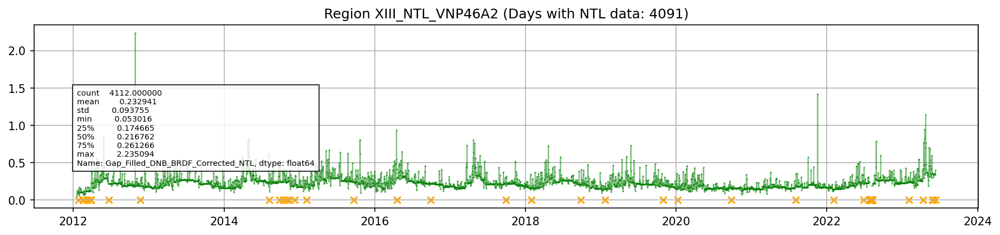


0it [00:00, ?it/s]
1449it [00:00, 14478.00it/s]
4142it [00:00, 15603.82it/s]


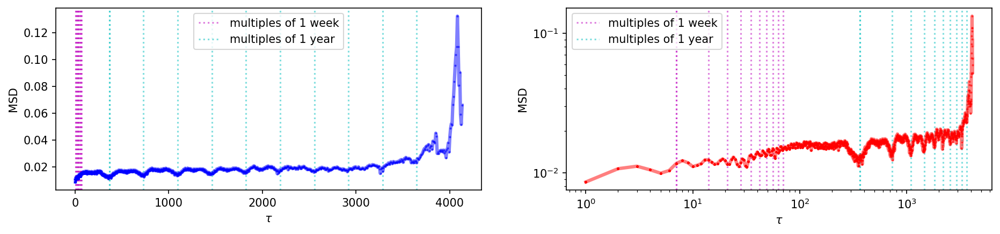

 73%|███████████████████████████████▌           | 11/15 [00:11<00:04,  1.01s/it]

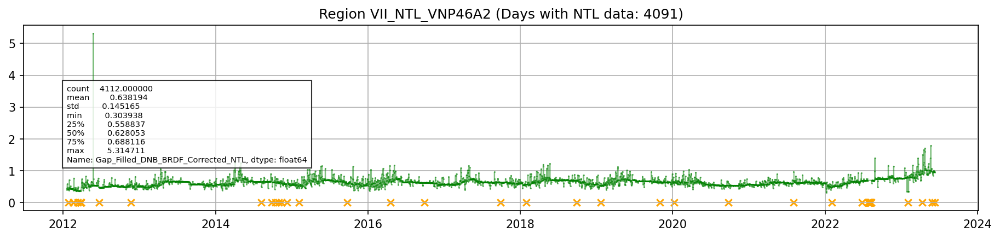


0it [00:00, ?it/s]
1438it [00:00, 14372.82it/s]
4142it [00:00, 15195.72it/s]


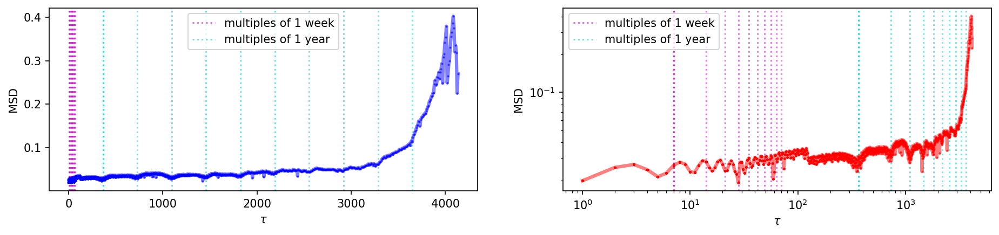

 80%|██████████████████████████████████▍        | 12/15 [00:11<00:02,  1.01it/s]

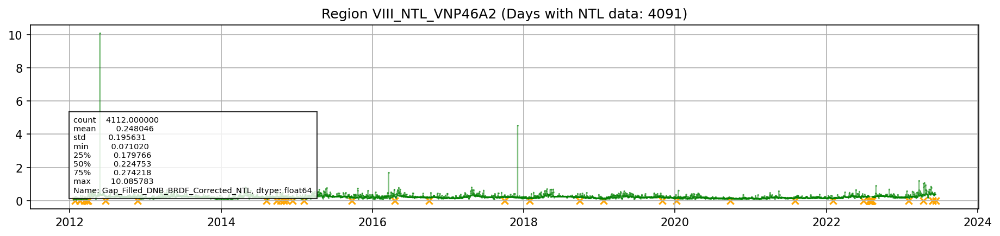


0it [00:00, ?it/s]
1613it [00:00, 16129.17it/s]
4142it [00:00, 17055.22it/s]


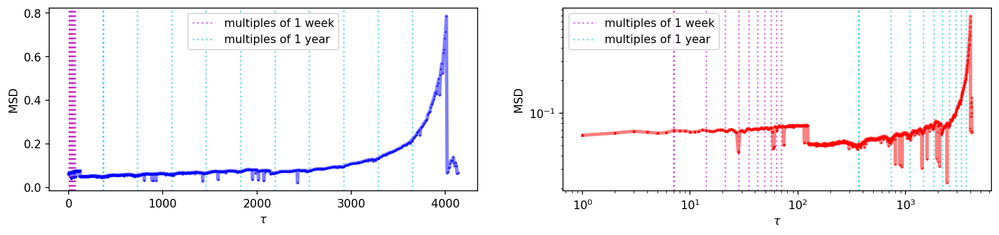

 87%|█████████████████████████████████████▎     | 13/15 [00:12<00:01,  1.06it/s]

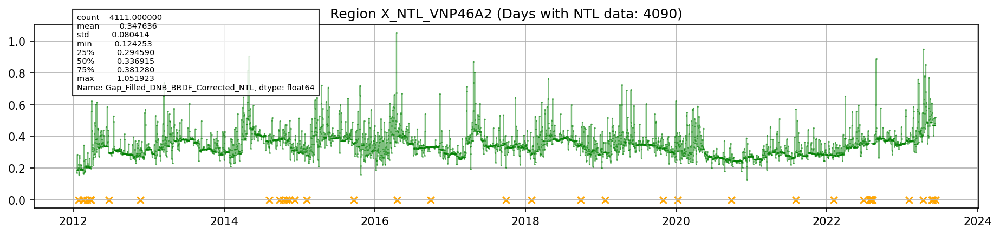


0it [00:00, ?it/s]
1629it [00:00, 16285.28it/s]
4142it [00:00, 17286.72it/s]


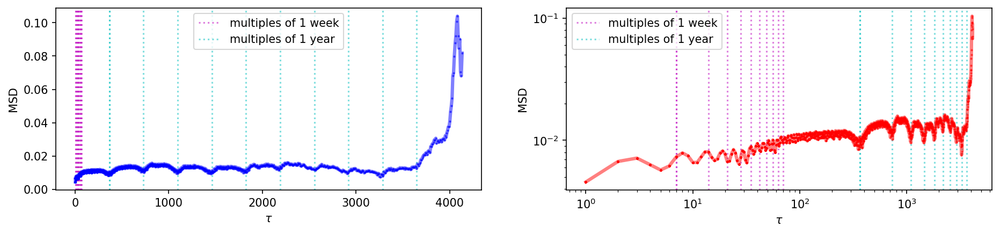

 93%|████████████████████████████████████████▏  | 14/15 [00:13<00:00,  1.03it/s]

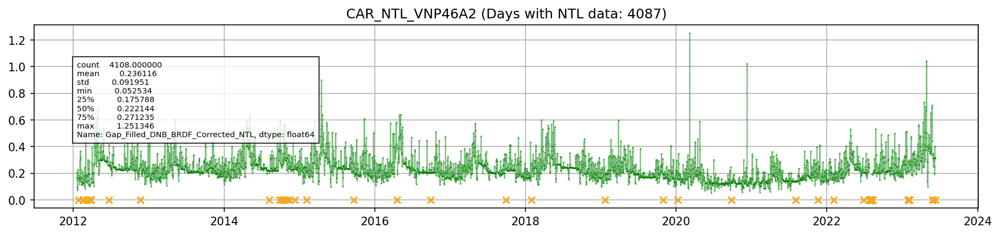


0it [00:00, ?it/s]
1666it [00:00, 16651.52it/s]
4142it [00:00, 17403.75it/s]


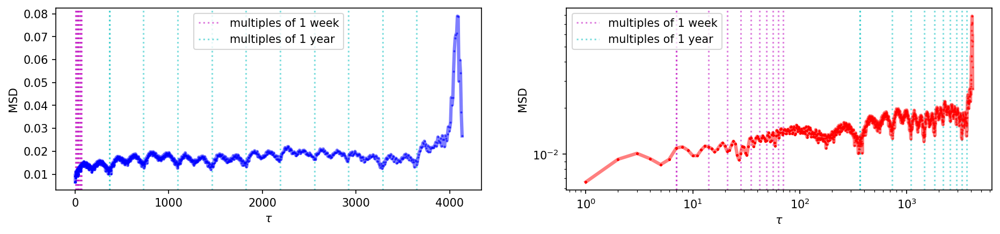

100%|███████████████████████████████████████████| 15/15 [00:14<00:00,  1.02it/s]


In [414]:
for NTL_data in tqdm(regional_NTL):

    dataframe = pd.read_csv(data_path+NTL_data, parse_dates=True, index_col = 0)
    data = dataframe['Gap_Filled_DNB_BRDF_Corrected_NTL']

    date_range = pd.date_range(start='2012-01-19', end='2023-06-12', freq='D')
    data_reindexed = data.reindex(date_range)
    NTL_missing_dates = data_reindexed[data_reindexed.isna()]
    no_obs = len(NTL_missing_dates)

    plt.figure(dpi = 150, figsize = (15,3))
    plt.grid()
    plt.plot(data, 'g.-', drawstyle = 'steps-mid', alpha = 0.5, ms = 1, lw = 1)
    plt.text(datetime.date(2012, 1, 19), data.mean()*2, str(data.describe()),
             fontsize=7, bbox=dict(facecolor='white', alpha=0.8))
    plt.title(NTL_data[:-4] + ' (Days with NTL data: ' + str(len(data) - no_obs) + ')')
    plt.scatter(NTL_missing_dates.index, [0] * no_obs, color='orange', marker='x',
            label='No sensor data record  (' + str(no_obs) + ' observations)')
#     plt.savefig("../results/" + str(NTL_data[:-4]) + ".png")
    plt.show()

    n_tau = len(data)
    tau_vals = np.logspace(0,np.log10(n_tau), n_tau)
    delta_vals = np.round(tau_vals/dt).astype(int)

    n = len(data)
    n_samp = 1
    n_tau = len(tau_vals)
    dx_tau = np.empty((n, n_tau))*np.nan

    for i, tau in tqdm(enumerate(tau_vals)):
        delta = delta_vals[i]
        data_trunc = data[:-1*delta]
        data_shift = data[delta:]
        dx = data_shift.values - data_trunc.values
        dx_tau[:len(dx), i] = dx.T

    msd_tau = np.empty((n_tau, n_samp))*np.nan
    for i, tau in enumerate(tau_vals):
        dx2_sum = np.nansum(dx_tau[:, i]**2)
        denom = n-delta_vals[i]
        msd_tau[i, i_samp] = dx2_sum/denom

    plt.figure(dpi = 150, figsize = (15,3))

    plt.subplot(121)
    for year in np.arange(1,11)*7: plt.axvline(year, ls=':', color = 'm', alpha = 0.5)
    plt.axvline(7, ls=':', color = 'm', alpha = 0.5, label = 'multiples of 1 week')
    for year in np.arange(1,11)*365: plt.axvline(year, ls=':', color = 'c', alpha = 0.5)
    plt.axvline(365, ls=':', color = 'c', alpha = 0.5, label = 'multiples of 1 year')


    plt.plot(delta_vals, msd_tau, 'bo-', alpha = 0.5,  ms = 1, lw = 3)
    plt.xlabel(r"$\tau$")
    plt.ylabel("MSD")
    plt.legend()

    plt.subplot(122)
    for year in np.arange(1,11)*7: plt.axvline(year, ls=':', color = 'm', alpha = 0.5)
    plt.axvline(7, ls=':', color = 'm', alpha = 0.5, label = 'multiples of 1 week')
    for year in np.arange(1,11)*365: plt.axvline(year, ls=':', color = 'c', alpha = 0.5)
    plt.axvline(365, ls=':', color = 'c', alpha = 0.5, label = 'multiples of 1 year')


    plt.plot(delta_vals, msd_tau, 'ro-', alpha = 0.5, ms = 1, lw = 3)
    msd_theo = tau_vals
    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel(r"$\tau$")
    plt.ylabel("MSD")
    plt.legend()
#     plt.savefig("../results/" + str(NTL_data[:-4]) + "_MSD.png")
    plt.show()